# COVID-19 Tweets from April 2020
# Data Cleaning and EDA Part 2
## Samuel Park
## 2021-10-31

*Set runtime mode to "High-RAM"

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns

In [2]:
# mount google drive to access files
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


[Original dataset](https://www.kaggle.com/smid80/coronavirus-covid19-tweets-early-april) was provided by Shane Smith on Kaggle. It was split into early and late April csv files. The two files were combined manually combined in an earlier EDA from which only the English tweets were selected. The dataset imported below contains the English tweets.

In [3]:
tweets = pd.read_csv('/content/drive/MyDrive/BrainStation/Capstone/covid19_tweets_backup/data_backup/tweets_en_colab.csv', lineterminator='\n', index_col=0, header=0)

/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



In [4]:
tweets.head()

,status_id,user_id,created_at,screen_name,text,source,reply_to_status_id,reply_to_user_id,reply_to_screen_name,is_quote,is_retweet,favourites_count,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,account_lang,account_created_at,verified,lang
2,1244051645975191557,80943559,2020-03-29T00:00:00Z,rlieving,“People are just storing up. They are staying ...,TweetDeck,NaN,NaN,NaN,False,False,604,0,NaN,NaN,NaN,136,457,NaN,2009-10-08T21:06:08Z,False,en
6,1244051646935633921,27922157,2020-03-29T00:00:00Z,AmerMedicalAssn,.@PatriceHarrisMD spoke with @YahooFinance abo...,Sprinklr,NaN,NaN,NaN,False,False,2894,3,NaN,NaN,NaN,714952,6877,NaN,2009-03-31T17:50:31Z,True,en
7,1244051645971025920,1115874631,2020-03-29T00:00:00Z,CGTNOfficial,First medical team aiding #Wuhan in fight agai...,Twitter Media Studio,NaN,NaN,NaN,False,False,65,18,NaN,NaN,NaN,14040072,55,NaN,2013-01-24T03:18:59Z,True,en
9,1244051647149543426,108845320,2020-03-29T00:00:00Z,OnTopMag,.@KathyGriffin: @realDonaldTrump Is 'Lying' Ab...,Twitter for Advertisers,NaN,NaN,NaN,False,False,2658,1,NaN,NaN,NaN,5042,5389,NaN,2010-01-27T05:23:15Z,False,en
14,1244051645102579712,17673635,2020-03-29T00:00:00Z,livemint,#CoronaUpdate | Johns Hopkins University has s...,TweetDeck,NaN,NaN,NaN,False,False,474,2,NaN,NaN,NaN,1862858,127,NaN,2008-11-27T09:07:38Z,True,en


In [5]:
# reset the indices
tweets.reset_index(drop=True, inplace=True)
tweets.head()

,status_id,user_id,created_at,screen_name,text,source,reply_to_status_id,reply_to_user_id,reply_to_screen_name,is_quote,is_retweet,favourites_count,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,account_lang,account_created_at,verified,lang
0,1244051645975191557,80943559,2020-03-29T00:00:00Z,rlieving,“People are just storing up. They are staying ...,TweetDeck,NaN,NaN,NaN,False,False,604,0,NaN,NaN,NaN,136,457,NaN,2009-10-08T21:06:08Z,False,en
1,1244051646935633921,27922157,2020-03-29T00:00:00Z,AmerMedicalAssn,.@PatriceHarrisMD spoke with @YahooFinance abo...,Sprinklr,NaN,NaN,NaN,False,False,2894,3,NaN,NaN,NaN,714952,6877,NaN,2009-03-31T17:50:31Z,True,en
2,1244051645971025920,1115874631,2020-03-29T00:00:00Z,CGTNOfficial,First medical team aiding #Wuhan in fight agai...,Twitter Media Studio,NaN,NaN,NaN,False,False,65,18,NaN,NaN,NaN,14040072,55,NaN,2013-01-24T03:18:59Z,True,en
3,1244051647149543426,108845320,2020-03-29T00:00:00Z,OnTopMag,.@KathyGriffin: @realDonaldTrump Is 'Lying' Ab...,Twitter for Advertisers,NaN,NaN,NaN,False,False,2658,1,NaN,NaN,NaN,5042,5389,NaN,2010-01-27T05:23:15Z,False,en
4,1244051645102579712,17673635,2020-03-29T00:00:00Z,livemint,#CoronaUpdate | Johns Hopkins University has s...,TweetDeck,NaN,NaN,NaN,False,False,474,2,NaN,NaN,NaN,1862858,127,NaN,2008-11-27T09:07:38Z,True,en


In [6]:
tweets.shape

(8133785, 22)

There are ~8.1 million rows and 22 columns in this English-tweet-only dataset.

In [7]:
tweets.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8133785 entries, 0 to 8133784
Data columns (total 22 columns):
 #   Column                Dtype  
---  ------                -----  
 0   status_id             int64  
 1   user_id               int64  
 2   created_at            object 
 3   screen_name           object 
 4   text                  object 
 5   source                object 
 6   reply_to_status_id    float64
 7   reply_to_user_id      float64
 8   reply_to_screen_name  object 
 9   is_quote              bool   
 10  is_retweet            bool   
 11  favourites_count      int64  
 12  retweet_count         int64  
 13  country_code          object 
 14  place_full_name       object 
 15  place_type            object 
 16  followers_count       int64  
 17  friends_count         int64  
 18  account_lang          float64
 19  account_created_at    object 
 20  verified              bool   
 21  lang                  object 
dtypes: bool(3), float64(3), int64(6), object(1

`created_at` column should be in datetime format. `status_id`, `user_id`, `reply_to_status_id` and `reply_to_user_id` should be in `str` format because these are unique values for each tweet and user. `account_lang` should most likely be in `object` format because it's a string that denotes the language code. `account_created_at` should be in datetime format. 

### Change `created_at` and `account_created_at` to `datetime64` 

In [8]:
# source: https://datatofish.com/replace-character-pandas-dataframe/
tweets['created_at'] = tweets['created_at'].str.replace('T', ' ')
tweets['created_at'] = tweets['created_at'].str.replace('Z', '')

# check if the T's and Z's have been removed/replaced
tweets.head(3)

,status_id,user_id,created_at,screen_name,text,source,reply_to_status_id,reply_to_user_id,reply_to_screen_name,is_quote,is_retweet,favourites_count,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,account_lang,account_created_at,verified,lang
0,1244051645975191557,80943559,2020-03-29 00:00:00,rlieving,“People are just storing up. They are staying ...,TweetDeck,NaN,NaN,NaN,False,False,604,0,NaN,NaN,NaN,136,457,NaN,2009-10-08T21:06:08Z,False,en
1,1244051646935633921,27922157,2020-03-29 00:00:00,AmerMedicalAssn,.@PatriceHarrisMD spoke with @YahooFinance abo...,Sprinklr,NaN,NaN,NaN,False,False,2894,3,NaN,NaN,NaN,714952,6877,NaN,2009-03-31T17:50:31Z,True,en
2,1244051645971025920,1115874631,2020-03-29 00:00:00,CGTNOfficial,First medical team aiding #Wuhan in fight agai...,Twitter Media Studio,NaN,NaN,NaN,False,False,65,18,NaN,NaN,NaN,14040072,55,NaN,2013-01-24T03:18:59Z,True,en


In [9]:
# convert the dtype of cleaned 'created_at' to datetime64
tweets['created_at'] = pd.to_datetime(tweets['created_at'], format='%Y-%m-%d %H:%M:%S')

In [10]:
# check
display(tweets.info())
tweets.tail(3)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8133785 entries, 0 to 8133784
Data columns (total 22 columns):
 #   Column                Dtype         
---  ------                -----         
 0   status_id             int64         
 1   user_id               int64         
 2   created_at            datetime64[ns]
 3   screen_name           object        
 4   text                  object        
 5   source                object        
 6   reply_to_status_id    float64       
 7   reply_to_user_id      float64       
 8   reply_to_screen_name  object        
 9   is_quote              bool          
 10  is_retweet            bool          
 11  favourites_count      int64         
 12  retweet_count         int64         
 13  country_code          object        
 14  place_full_name       object        
 15  place_type            object        
 16  followers_count       int64         
 17  friends_count         int64         
 18  account_lang          float64       
 19  

None

,status_id,user_id,created_at,screen_name,text,source,reply_to_status_id,reply_to_user_id,reply_to_screen_name,is_quote,is_retweet,favourites_count,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,account_lang,account_created_at,verified,lang
8133782,1256010442696245253,18198832,2020-04-30 23:59:59,TheScientistLLC,"While the lockdown for #COVID19 continues on, ...",HubSpot,NaN,NaN,NaN,False,False,978,1,NaN,NaN,NaN,66844,383,NaN,2008-12-17T20:32:46Z,True,en
8133783,1256010440154513408,937899468585828352,2020-04-30 23:59:59,portarican_RT,Best answer. #COVID19 #WeMournThemAll https://...,Twitter Web App,NaN,NaN,NaN,True,False,44903,0,NaN,NaN,NaN,5503,5909,NaN,2017-12-05T04:20:33Z,False,en
8133784,1256010440007716867,1043656483,2020-04-30 23:59:59,Drz123Z,@WFXTMalini @CMichaelGibson @boston25 I had th...,Twitter for iPhone,1.255987e+18,62144220.0,WFXTMalini,False,False,5906,0,US,"Weymouth, MA",city,85,127,NaN,2012-12-29T02:35:23Z,False,en


It has been converted to `datetime64` type. But, it's not showing the hours, minutes, and seconds for some reason. Let's check if they are really omitted.

In [11]:
# inspect the column
tweets.loc[:, 'created_at']

0         2020-03-29 00:00:00
1         2020-03-29 00:00:00
2         2020-03-29 00:00:00
3         2020-03-29 00:00:00
4         2020-03-29 00:00:00
                  ...        
8133780   2020-04-30 23:59:58
8133781   2020-04-30 23:59:59
8133782   2020-04-30 23:59:59
8133783   2020-04-30 23:59:59
8133784   2020-04-30 23:59:59
Name: created_at, Length: 8133785, dtype: datetime64[ns]

Actually, it just was not showing up in the expanded dataframe. The information is still there.

Let's do the same to `account_created_at` column.

In [12]:
# replace T's with a space
tweets['account_created_at'] = tweets['account_created_at'].str.replace('T', ' ')
# replace Z's with whitespace
tweets['account_created_at'] = tweets['account_created_at'].str.replace('Z', '')

# check if the T's and Z's have been removed/replaced
tweets['account_created_at'].head()

0    2009-10-08 21:06:08
1    2009-03-31 17:50:31
2    2013-01-24 03:18:59
3    2010-01-27 05:23:15
4    2008-11-27 09:07:38
Name: account_created_at, dtype: object

In [13]:
# convert the dtype to datetime64
tweets['account_created_at'] = pd.to_datetime(tweets['account_created_at'], format='%Y-%m-%d %H:%M:%S')
tweets['account_created_at']

0         2009-10-08 21:06:08
1         2009-03-31 17:50:31
2         2013-01-24 03:18:59
3         2010-01-27 05:23:15
4         2008-11-27 09:07:38
                  ...        
8133780   2007-06-27 20:09:29
8133781   2017-09-25 14:16:41
8133782   2008-12-17 20:32:46
8133783   2017-12-05 04:20:33
8133784   2012-12-29 02:35:23
Name: account_created_at, Length: 8133785, dtype: datetime64[ns]

In [14]:
# check dtypes again
tweets.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8133785 entries, 0 to 8133784
Data columns (total 22 columns):
 #   Column                Dtype         
---  ------                -----         
 0   status_id             int64         
 1   user_id               int64         
 2   created_at            datetime64[ns]
 3   screen_name           object        
 4   text                  object        
 5   source                object        
 6   reply_to_status_id    float64       
 7   reply_to_user_id      float64       
 8   reply_to_screen_name  object        
 9   is_quote              bool          
 10  is_retweet            bool          
 11  favourites_count      int64         
 12  retweet_count         int64         
 13  country_code          object        
 14  place_full_name       object        
 15  place_type            object        
 16  followers_count       int64         
 17  friends_count         int64         
 18  account_lang          float64       
 19  

`created_at` and `account_created_at` have been successfully converted to `datetime64` format.

### Visualize Tweet Counts by Date

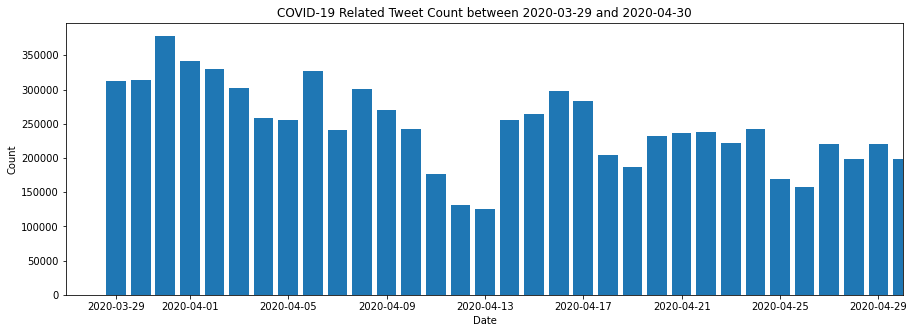

In [15]:
# get tweet count for each date in the dataset
tweet_count_by_date = tweets['created_at'].dt.date.value_counts()
# sort the dates
tweet_count_by_date.sort_index()

# plot the distribution
plt.figure(figsize=(15,5))
plt.bar(tweet_count_by_date.index, tweet_count_by_date)
plt.xlim(right=max(tweet_count_by_date.index))
plt.title('COVID-19 Related Tweet Count between 2020-03-29 and 2020-04-30')
plt.xlabel('Date')
plt.ylabel('Count')
plt.show()


A gradual decline in number of tweets over the timespan is noticeable. The peak was on Wednesday, March 31st, 2020. The lowest count was recorded on Tuesday, April 13th.

### Change `status_id`, `user_id`, `reply_to_status_id`, and `reply_to_user_id` to `str`

Now, let's convert `status_id`, `user_id`, `reply_to_status_id` and `reply_to_user_id` into `str` type.

But first, we have to convert `reply_to_status_id` and `reply_to_user_id` into `int` before we convert them into `str`.  That is because if we converted them into `str` directly, the scientific notation (x.xxe+18) would be preserved. We do not want that.

In [16]:
tweets = tweets.astype({'reply_to_status_id': 'Int64', 'reply_to_user_id': 'Int64'}) # capital I for Int64 is for pandas, diff from numpy
display(tweets.tail(5))
tweets.info()

,status_id,user_id,created_at,screen_name,text,source,reply_to_status_id,reply_to_user_id,reply_to_screen_name,is_quote,is_retweet,favourites_count,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,account_lang,account_created_at,verified,lang
8133780,1256010435641462784,7117302,2020-04-30 23:59:58,ozsultan,"Dear @NYCMayor,\n\nThe city has Millions to sp...",Twitter for iPhone,<NA>,<NA>,NaN,False,False,18897,0,NaN,NaN,NaN,8723,7747,NaN,2007-06-27 20:09:29,False,en
8133781,1256010442876608512,912319950559354880,2020-04-30 23:59:59,DriveLockGlobal,In the middle of the #COVID19 sales surge in M...,HubSpot,<NA>,<NA>,NaN,False,False,84,0,NaN,NaN,NaN,365,1333,NaN,2017-09-25 14:16:41,False,en
8133782,1256010442696245253,18198832,2020-04-30 23:59:59,TheScientistLLC,"While the lockdown for #COVID19 continues on, ...",HubSpot,<NA>,<NA>,NaN,False,False,978,1,NaN,NaN,NaN,66844,383,NaN,2008-12-17 20:32:46,True,en
8133783,1256010440154513408,937899468585828352,2020-04-30 23:59:59,portarican_RT,Best answer. #COVID19 #WeMournThemAll https://...,Twitter Web App,<NA>,<NA>,NaN,True,False,44903,0,NaN,NaN,NaN,5503,5909,NaN,2017-12-05 04:20:33,False,en
8133784,1256010440007716867,1043656483,2020-04-30 23:59:59,Drz123Z,@WFXTMalini @CMichaelGibson @boston25 I had th...,Twitter for iPhone,1255986583649554432,62144220,WFXTMalini,False,False,5906,0,US,"Weymouth, MA",city,85,127,NaN,2012-12-29 02:35:23,False,en


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8133785 entries, 0 to 8133784
Data columns (total 22 columns):
 #   Column                Dtype         
---  ------                -----         
 0   status_id             int64         
 1   user_id               int64         
 2   created_at            datetime64[ns]
 3   screen_name           object        
 4   text                  object        
 5   source                object        
 6   reply_to_status_id    Int64         
 7   reply_to_user_id      Int64         
 8   reply_to_screen_name  object        
 9   is_quote              bool          
 10  is_retweet            bool          
 11  favourites_count      int64         
 12  retweet_count         int64         
 13  country_code          object        
 14  place_full_name       object        
 15  place_type            object        
 16  followers_count       int64         
 17  friends_count         int64         
 18  account_lang          float64       
 19  

Now we can convert them into `str`.

In [17]:
tweets = tweets.astype({'status_id': str, 'user_id': str, 'reply_to_status_id': str, 'reply_to_user_id': str})
display(tweets.sample(8))
tweets.info()

,status_id,user_id,created_at,screen_name,text,source,reply_to_status_id,reply_to_user_id,reply_to_screen_name,is_quote,is_retweet,favourites_count,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,account_lang,account_created_at,verified,lang
6148833,1252600429881499648,53904097,2020-04-21 14:09:49,suman_banerjee,"#Oktoberfest , the world's biggest beer festiv...",Twitter for Android,<NA>,<NA>,NaN,False,False,84,0,NaN,NaN,NaN,47,60,NaN,2009-07-05 12:54:28,False,en
7925142,1255625888181489665,42728664,2020-04-29 22:31:54,LeslyeColvin,"Georgia's @GovKemp is reopening businesses, bu...",Twitter Web App,<NA>,<NA>,NaN,False,False,20262,1,NaN,NaN,NaN,962,2807,NaN,2009-05-26 21:37:36,False,en
7698381,1255255889772240896,1007795502929203205,2020-04-28 22:01:40,Jewels8031,@funder How disrespectful to ignore a policy! ...,Twitter for iPhone,1255236330616954880,14247236,funder,False,False,18752,0,NaN,NaN,NaN,458,1145,NaN,2018-06-16 01:22:26,False,en
7945749,1255674203078037506,3419867877,2020-04-30 01:43:53,ICUNURSESROCK,#COVID19 #coronavirus #Honesty Officials block...,Twitter for iPhone,<NA>,<NA>,NaN,False,False,1492,0,NaN,NaN,NaN,1845,3158,NaN,2015-08-13 10:56:59,False,en
7323353,1254652014241300480,208995765,2020-04-27 06:02:05,qatarday,#PHCC confirms readiness to provide #health se...,Twitter Web App,<NA>,<NA>,NaN,False,False,4472,0,NaN,NaN,NaN,26863,748,NaN,2010-10-28 10:01:31,False,en
6730532,1253479862981058562,939095799345983488,2020-04-24 00:24:22,robertson_alton,@dananessel Thank you Madam AG. Back to a time...,Twitter Web App,<NA>,2961639518,dananessel,False,False,3048,0,NaN,NaN,NaN,977,5002,NaN,2017-12-08 11:34:20,False,en
995118,1245127045828526085,22799678,2020-03-31 23:13:15,Louiebella,#DonaldTrump @realDonaldTrump you can be absen...,Twitter for iPhone,<NA>,<NA>,NaN,False,False,1090,0,NaN,NaN,NaN,546,1044,NaN,2009-03-04 17:01:30,False,en
6445275,1253024514247733251,340622978,2020-04-22 18:14:58,itsofficialJR,Check out Jonathan Rodriguez's video! #TikTok ...,Twitter for Android,<NA>,<NA>,NaN,False,False,4103,0,NaN,NaN,NaN,6869,1915,NaN,2011-07-23 00:38:47,False,en


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8133785 entries, 0 to 8133784
Data columns (total 22 columns):
 #   Column                Dtype         
---  ------                -----         
 0   status_id             object        
 1   user_id               object        
 2   created_at            datetime64[ns]
 3   screen_name           object        
 4   text                  object        
 5   source                object        
 6   reply_to_status_id    object        
 7   reply_to_user_id      object        
 8   reply_to_screen_name  object        
 9   is_quote              bool          
 10  is_retweet            bool          
 11  favourites_count      int64         
 12  retweet_count         int64         
 13  country_code          object        
 14  place_full_name       object        
 15  place_type            object        
 16  followers_count       int64         
 17  friends_count         int64         
 18  account_lang          float64       
 19  

The columns have been successfully converted to `str` (`object`) type.

In [18]:
tweets.describe()

,favourites_count,retweet_count,followers_count,friends_count,account_lang
count,8.133785e+06,8.133785e+06,8.133785e+06,8.133785e+06,0.0
mean,1.295829e+04,3.366772e+00,6.422916e+04,2.328876e+03,NaN
std,3.914638e+04,7.012990e+01,6.230040e+05,1.231277e+04,NaN
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,NaN
25%,2.640000e+02,0.000000e+00,1.520000e+02,1.700000e+02,NaN
50%,1.843000e+03,0.000000e+00,8.460000e+02,5.750000e+02,NaN
75%,8.874000e+03,1.000000e+00,4.226000e+03,1.704000e+03,NaN
max,1.995152e+06,3.440700e+04,8.374142e+07,1.599416e+06,NaN


Are there any duplicate columns or columns that are entirely missing?

Let's first check if there are columns that contain redundant information.

In [19]:
tweets.head(2)

,status_id,user_id,created_at,screen_name,text,source,reply_to_status_id,reply_to_user_id,reply_to_screen_name,is_quote,is_retweet,favourites_count,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,account_lang,account_created_at,verified,lang
0,1244051645975191557,80943559,2020-03-29,rlieving,“People are just storing up. They are staying ...,TweetDeck,<NA>,<NA>,NaN,False,False,604,0,NaN,NaN,NaN,136,457,NaN,2009-10-08 21:06:08,False,en
1,1244051646935633921,27922157,2020-03-29,AmerMedicalAssn,.@PatriceHarrisMD spoke with @YahooFinance abo...,Sprinklr,<NA>,<NA>,NaN,False,False,2894,3,NaN,NaN,NaN,714952,6877,NaN,2009-03-31 17:50:31,True,en


### Drop columns

`reply_to_screen_name` is redundant becaues its information is also present in `reply_to_user_id`. The latter is more unique and informative than the screen names that users can arbitrarily set. Therefore, `reply_to_screen_name` will be dropped.

We will also drop `lang` column because this dataset only contains English tweets.

`account_lang` is entirely empty, so we will drop it.

In [20]:
tweets.drop(['reply_to_screen_name', 'lang', 'account_lang'], axis=1, inplace=True)

In [21]:
# check if 'reply_to_screen_name' and 'lang' have been dropped
tweets.head(1)

,status_id,user_id,created_at,screen_name,text,source,reply_to_status_id,reply_to_user_id,is_quote,is_retweet,favourites_count,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,account_created_at,verified
0,1244051645975191557,80943559,2020-03-29,rlieving,“People are just storing up. They are staying ...,TweetDeck,<NA>,<NA>,False,False,604,0,NaN,NaN,NaN,136,457,2009-10-08 21:06:08,False


## Check for Any Missing Values

Let's check if any of the columns are entirely consisted of missing values.



In [22]:
# For each column, how many values are missing?
display(tweets.isna().sum())
# For each column, what percentage of values is missing?
display(tweets.isna().mean()*100)

status_id                   0
user_id                     0
created_at                  0
screen_name                 2
text                        0
source                     79
reply_to_status_id          0
reply_to_user_id            0
is_quote                    0
is_retweet                  0
favourites_count            0
retweet_count               0
country_code          7754068
place_full_name       7751976
place_type            7751976
followers_count             0
friends_count               0
account_created_at          0
verified                    0
dtype: int64

status_id              0.000000
user_id                0.000000
created_at             0.000000
screen_name            0.000025
text                   0.000000
source                 0.000971
reply_to_status_id     0.000000
reply_to_user_id       0.000000
is_quote               0.000000
is_retweet             0.000000
favourites_count       0.000000
retweet_count          0.000000
country_code          95.331608
place_full_name       95.305888
place_type            95.305888
followers_count        0.000000
friends_count          0.000000
account_created_at     0.000000
verified               0.000000
dtype: float64

Two rows are missing `screen_name`. Let's take a look at them.

In [23]:
# pull the two rows that are missing screen_name
tweets.loc[tweets['screen_name'].isna()]

,status_id,user_id,created_at,screen_name,text,source,reply_to_status_id,reply_to_user_id,is_quote,is_retweet,favourites_count,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,account_created_at,verified
2206515,1246540052727037959,14802766,2020-04-04 20:48:02,NaN,😡🗯️ @MarkGoulston recommends taking time with ...,Twitter for iPhone,<NA>,<NA>,False,False,4429,0,US,"Castle Hills, TX",city,9148,5935,2008-05-16 19:09:49,True
3872470,1248759713849802753,14802766,2020-04-10 23:48:11,NaN,Webinars during #COVID19 be like... https://t....,Twitter for iPhone,<NA>,<NA>,False,False,4566,0,NaN,NaN,NaN,9144,5929,2008-05-16 19:09:49,True


The two rows are from one user whose `user_id` is 14802766. Let's see if we can find this user's `screen_name` in other rows.

In [24]:
# Get all the rows where user_id == 14802766
tweets.loc[tweets['user_id']=='14802766']

,status_id,user_id,created_at,screen_name,text,source,reply_to_status_id,reply_to_user_id,is_quote,is_retweet,favourites_count,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,account_created_at,verified
2206515,1246540052727037959,14802766,2020-04-04 20:48:02,NaN,😡🗯️ @MarkGoulston recommends taking time with ...,Twitter for iPhone,<NA>,<NA>,False,False,4429,0,US,"Castle Hills, TX",city,9148,5935,2008-05-16 19:09:49,True
3872470,1248759713849802753,14802766,2020-04-10 23:48:11,NaN,Webinars during #COVID19 be like... https://t....,Twitter for iPhone,<NA>,<NA>,False,False,4566,0,NaN,NaN,NaN,9144,5929,2008-05-16 19:09:49,True


Unfortunately, there are no other rows with that `user_id` from which we could pull the `screen_name`. We wil drop these two rows as they make up a very small portion of the dataset (0.000025%). 

In [25]:
# get the indices of the rows that are missing screen_name
missing_screen_name_index = tweets.loc[tweets['screen_name'].isna()].index
# drop those rows
tweets.drop(missing_screen_name_index, axis=0, inplace=True)

In [26]:
# check
print(tweets['screen_name'].isna().any())
# check shape
tweets.shape


False


(8133783, 19)

We see that the number of rows has decreased by 2 and that there are no missing values in `screen_name` column anymore.

There are 83 rows that are missing `source` values (i.e., which platform they used to create the tweet - iPhone, desktop, etc.) They only consist 0.0006% of the dataset. We will drop those rows.

In [27]:
# pull the rows missing sources
# display(tweets.loc[tweets['source'].isna()].head(3))

# get the indices of those rows
source_missing_index = tweets.loc[tweets['source'].isna()].index
# source_missing_index

In [28]:
tweets.drop(labels=source_missing_index, axis=0, inplace=True)

In [29]:
# check all missing rows in 'source' column have been dropped
tweets['source'].isna().sum()

0

All 83 missing rows have been dropped.

### Impute `country_code`, `place_type`, `place_full_name`

`country_code`, `place_type`, `place_full_name` are all location-related columns. Their values are recorded as NaNs when the user did not use the geo-tagging feature at the time of creating their tweet. 

We will replace NaNs with "NA" with corresponding prefixes for each column (ex. "country_code NA", "place_type NA", "place_full_name NA").

In [30]:
missing_country_code_index = tweets.loc[tweets['country_code'].isna()].index
tweets.loc[missing_country_code_index]

,status_id,user_id,created_at,screen_name,text,source,reply_to_status_id,reply_to_user_id,is_quote,is_retweet,favourites_count,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,account_created_at,verified
0,1244051645975191557,80943559,2020-03-29 00:00:00,rlieving,“People are just storing up. They are staying ...,TweetDeck,<NA>,<NA>,False,False,604,0,NaN,NaN,NaN,136,457,2009-10-08 21:06:08,False
1,1244051646935633921,27922157,2020-03-29 00:00:00,AmerMedicalAssn,.@PatriceHarrisMD spoke with @YahooFinance abo...,Sprinklr,<NA>,<NA>,False,False,2894,3,NaN,NaN,NaN,714952,6877,2009-03-31 17:50:31,True
2,1244051645971025920,1115874631,2020-03-29 00:00:00,CGTNOfficial,First medical team aiding #Wuhan in fight agai...,Twitter Media Studio,<NA>,<NA>,False,False,65,18,NaN,NaN,NaN,14040072,55,2013-01-24 03:18:59,True
3,1244051647149543426,108845320,2020-03-29 00:00:00,OnTopMag,.@KathyGriffin: @realDonaldTrump Is 'Lying' Ab...,Twitter for Advertisers,<NA>,<NA>,False,False,2658,1,NaN,NaN,NaN,5042,5389,2010-01-27 05:23:15,False
4,1244051645102579712,17673635,2020-03-29 00:00:00,livemint,#CoronaUpdate | Johns Hopkins University has s...,TweetDeck,<NA>,<NA>,False,False,474,2,NaN,NaN,NaN,1862858,127,2008-11-27 09:07:38,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8133779,1256010438980128771,37621128,2020-04-30 23:59:58,willhel,Why are you all so late to the @BorisJohnson i...,Twitter for Android,<NA>,<NA>,True,False,15532,0,NaN,NaN,NaN,3029,3327,2009-05-04 08:18:39,False
8133780,1256010435641462784,7117302,2020-04-30 23:59:58,ozsultan,"Dear @NYCMayor,\n\nThe city has Millions to sp...",Twitter for iPhone,<NA>,<NA>,False,False,18897,0,NaN,NaN,NaN,8723,7747,2007-06-27 20:09:29,False
8133781,1256010442876608512,912319950559354880,2020-04-30 23:59:59,DriveLockGlobal,In the middle of the #COVID19 sales surge in M...,HubSpot,<NA>,<NA>,False,False,84,0,NaN,NaN,NaN,365,1333,2017-09-25 14:16:41,False
8133782,1256010442696245253,18198832,2020-04-30 23:59:59,TheScientistLLC,"While the lockdown for #COVID19 continues on, ...",HubSpot,<NA>,<NA>,False,False,978,1,NaN,NaN,NaN,66844,383,2008-12-17 20:32:46,True


In [31]:
# impute missing country_code values with 'country_code NA'
tweets['country_code'] = tweets['country_code'].fillna('country_code NA')
# check
tweets['country_code']

0          country_code NA
1          country_code NA
2          country_code NA
3          country_code NA
4          country_code NA
                ...       
8133780    country_code NA
8133781    country_code NA
8133782    country_code NA
8133783    country_code NA
8133784                 US
Name: country_code, Length: 8133704, dtype: object

The NaNs in `country_code` have been replaced with 'country_code NA'. Let's do the same for `place_type` and `place_full_name`.

In [32]:
# impute missing values in place_type and place_full_name columns
tweets['place_type'] = tweets['place_type'].fillna('place_type NA')
tweets['place_full_name'] = tweets['place_full_name'].fillna('place_full_name NA')

In [33]:
# check
tweets[['place_type', 'place_full_name']]

,place_type,place_full_name
0,place_type NA,place_full_name NA
1,place_type NA,place_full_name NA
2,place_type NA,place_full_name NA
3,place_type NA,place_full_name NA
4,place_type NA,place_full_name NA
...,...,...
8133780,place_type NA,place_full_name NA
8133781,place_type NA,place_full_name NA
8133782,place_type NA,place_full_name NA
8133783,place_type NA,place_full_name NA


### Visualize `place_type`, `place_full_name`, and `country_code`

In [34]:
unique_place_type_counts = tweets['place_type'].value_counts()
# calculate the percentages tweet counts by place_type
unique_place_type_pct = round(tweets['place_type'].value_counts()/tweets.shape[0]*100, 3)


# Plot the raw counts
fig = go.Figure(data=[go.Bar(
                            x=unique_place_type_counts.index,
                             y= unique_place_type_counts,
                             text=unique_place_type_counts,
                             textposition='auto'
)])
fig.update_layout(
    title='Distribution of Place Types of COVID-19 Tweets made in April 2020',
    xaxis_title='Place Type',
    yaxis_title='Tweet Count (millions)',
    width=800, height=600
)
fig.show()

# Plot the percentages
fig = go.Figure(data=[go.Bar(
                            x=unique_place_type_pct.index,
                             y= unique_place_type_pct,
                             text=unique_place_type_pct,
                             textposition='auto'
)])
fig.update_layout(
    title='Proportions of Place Types of COVID-19 Tweets made in April 2020',
    xaxis_title='Place Type',
    yaxis_title='Tweet Percentage (%)',
    width=800, height=600
)
fig.show()

Roughly 7.8 million tweets out of 8.1 million, or 95% of the data, were not geo-tagged (place_type NA, or not applicable). 3.8% of the tweets were geo-tagged in cities.

Note that even though some tweets had geo-tags, those tags were set by users. Therefore, they do not necessarily mean the users were actually at those locations.

In [35]:
tweets['place_full_name'].value_counts()

place_full_name NA      7751896
Manhattan, NY              6220
Los Angeles, CA            5606
Mumbai, India              5192
New Delhi, India           5073
                         ...   
Sanquelim, India              1
Health Hub                    1
Siddhivinayak Mandir          1
Panjimi                       1
Lake Arrowhead, CA            1
Name: place_full_name, Length: 26831, dtype: int64

In [36]:
unique_place_full_name_counts = tweets['place_full_name'].value_counts()[1:21]
unique_place_full_name_pct = round(tweets['place_full_name'].value_counts()[1:21]/tweets.shape[0]*100, 3)


# Plot
fig = go.Figure(data=[go.Bar(
                            x= unique_place_full_name_counts,
                            y=unique_place_full_name_counts.index,
                             text=unique_place_full_name_counts,
                             textposition='auto',
                             orientation='h'
)])
fig.update_layout(
    title='Top 20 Places by COVID-19 Tweet Count in April 2020',
    xaxis_title='Place Full Name',
    yaxis_title='Tweet Count ',
    width=800, height=600
)
fig.show()

# Plot the percentages
fig = go.Figure(data=[go.Bar(
                            x= unique_place_full_name_pct,
                            y=unique_place_full_name_pct.index,
                             text=unique_place_full_name_pct,
                             textposition='auto',
                             orientation='h'
)])
fig.update_layout(
    title='Top 20 Places by COVID-19 Tweet Percentage in April 2020',
    xaxis_title='Place Full Name',
    yaxis_title='Tweet Percentage (%)',
    width=800, height=600
)
fig.show()


The most frequent places among the geo-tagged tweets, were American cities, like Manhattan, Los Angeles, Brooklyn, etc. Indian, Nigerian, Kenyan, and Ugandan cities were also frequent. However, note that each of these geo-tagged places consisted less than 0.1% of the data. In other words, most tweets were predominantly missing geo-tags.

In [37]:
tweets['country_code'].value_counts()

country_code NA    7753988
US                  161212
GB                   55894
IN                   41618
CA                   21169
                    ...   
GD                       2
GF                       1
TO                       1
GL                       1
PN                       1
Name: country_code, Length: 217, dtype: int64

In [38]:
unique_country_code_counts = tweets['country_code'].value_counts()



# Plot
fig = go.Figure(data=[go.Bar(
                            x= unique_country_code_counts.index,
                            y=unique_country_code_counts,
                             text=unique_country_code_counts,
                             textposition='auto'
)])
fig.update_layout(
    title='Distribution of Country Codes of COVID-19 Tweets made in April 2020',
    xaxis_title='Country Code',
    yaxis_title='Tweet Count (millions)',
    width=800, height=600
)
fig.show()

The majority of country codes were "country_code NA", meaning most tweets (7.8M) were not geo-tagged. Let's visualise the remaining country codes separately.

In [39]:
unique_country_code_counts_minus_NA = tweets['country_code'].value_counts()[1:21]
display(unique_country_code_counts_minus_NA.head())

# Plot
fig = go.Figure(data=[go.Bar(
                            x= unique_country_code_counts_minus_NA.index,
                            y=unique_country_code_counts_minus_NA,
                             text=unique_country_code_counts_minus_NA,
                             textposition='auto'
)])
fig.update_layout(
    title='Top 20 Country Codes by COVID-19 Tweet Count in April 2020',
    xaxis_title='Country Code',
    yaxis_title='Tweet Count',
    width=800, height=600
)
fig.show()

US    161212
GB     55894
IN     41618
CA     21169
NG     15189
Name: country_code, dtype: int64

We can see that the United States (US) generated most COVID-19 related tweets in April, 2020, by a significant margin. The United Kingdom (GB) generated the second highest tweet count. India (IN) took the third place. Canada (CA) and Nigeria (NG) took the fourth and fifth place, respectively. 

Note that this dataset contains only English tweets from the original dataset, which had a variety of languages. Because this dataset is only consisted of English tweets, English-speaking or countries where many people speak English, like the US, UK, India, Canada, Nigeria are over-represented here.

## Check for Duplicated Rows

Let's investigate if there are any duplicated rows.

In [40]:
# print how many rows are duplicated
print(f'Number of duplicated rows: {tweets.duplicated().sum()}')

print(f'Percentage of duplicated rows: {tweets.duplicated().mean()*100}%')

# show the duplicated rows
duplicate_index = tweets.duplicated(keep=False)
tweets.loc[duplicate_index, :]

Number of duplicated rows: 398
Percentage of duplicated rows: 0.00489321962048287%


,status_id,user_id,created_at,screen_name,text,source,reply_to_status_id,reply_to_user_id,is_quote,is_retweet,favourites_count,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,account_created_at,verified
65,1244051665642192896,3064266184,2020-03-29 00:00:05,techjunkiejh,Doors slam shut across borderless Europe as #c...,Buffer,<NA>,<NA>,False,False,14818,0,country_code NA,place_full_name NA,place_type NA,28982,25081,2015-02-27 00:58:22,False
67,1244051665642192896,3064266184,2020-03-29 00:00:05,techjunkiejh,Doors slam shut across borderless Europe as #c...,Buffer,<NA>,<NA>,False,False,14818,0,country_code NA,place_full_name NA,place_type NA,28982,25081,2015-02-27 00:58:22,False
11311,1244067805265305600,1532718984,2020-03-29 01:04:13,marcfavell,@drninashapiro my Condolences from 🇨🇦🇨🇦🇨🇦#Wind...,Twitter for Android,1243960408131551232,253810773,False,False,763,0,country_code NA,place_full_name NA,place_type NA,106,768,2013-06-20 03:54:23,False
11312,1244067805265305600,1532718984,2020-03-29 01:04:13,marcfavell,@drninashapiro my Condolences from 🇨🇦🇨🇦🇨🇦#Wind...,Twitter for Android,1243960408131551232,253810773,False,False,763,0,country_code NA,place_full_name NA,place_type NA,106,768,2013-06-20 03:54:23,False
30914,1244098805093597184,3326054230,2020-03-29 03:07:24,mariadestrella,Rhode Island Actively Stopping New Yorkers to ...,Twitter for iPhone,<NA>,<NA>,False,False,121499,0,country_code NA,place_full_name NA,place_type NA,1256,279,2015-06-15 01:51:50,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8088371,1255923136417193992,1141041981390565376,2020-04-30 18:13:04,kate_hosk,@itvnews Best news due to #coronavirus 👏👏👏👏👏\n...,Twitter for Android,1255918612092764160,21866939,False,False,4521,0,country_code NA,place_full_name NA,place_type NA,1,111,2019-06-18 17:56:22,False
8102057,1255945376374407168,50023846,2020-04-30 19:41:26,JGaryDewberry,"#covid19 declared not man-made, so who did it ...",Twitter Web App,<NA>,<NA>,False,False,13865,0,country_code NA,place_full_name NA,place_type NA,3943,4254,2009-06-23 16:31:54,False
8102058,1255945376374407168,50023846,2020-04-30 19:41:26,JGaryDewberry,"#covid19 declared not man-made, so who did it ...",Twitter Web App,<NA>,<NA>,False,False,13865,0,country_code NA,place_full_name NA,place_type NA,3943,4254,2009-06-23 16:31:54,False
8120763,1255980826157879296,1159243226,2020-04-30 22:02:18,Boo_Boo_TheBear,@0164948345aa439 @thomaskaine5 The reason why ...,Twitter Web App,1255980225667743488,1159243226,False,False,221,0,country_code NA,place_full_name NA,place_type NA,83,79,2013-02-08 05:38:06,False


The `status_id` values, `user_id` values, timestamps in `created_at`, and contents of `text` columns all appear to be identically duplicated. Therefore, only the first occurences will be kept.

Note that `status_id`, also known as tweet ID, is unique to each tweet. Even if a user deleted and reposted the same tweet within split seconds, the `status_id` value would be different. 

In [41]:
# drop duplicates
tweets.drop_duplicates(keep='first', inplace=True)

In [42]:
# check if duplicates still exist
tweets.duplicated().sum()

0

All duplicate rows have been dropped.

Let's reset the indices.

In [43]:
# reset index
tweets.reset_index(drop=True, inplace=True)

In [44]:
# check
print(tweets.shape[0])
tweets.tail(3)

8133306


,status_id,user_id,created_at,screen_name,text,source,reply_to_status_id,reply_to_user_id,is_quote,is_retweet,favourites_count,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,account_created_at,verified
8133303,1256010442696245253,18198832,2020-04-30 23:59:59,TheScientistLLC,"While the lockdown for #COVID19 continues on, ...",HubSpot,<NA>,<NA>,False,False,978,1,country_code NA,place_full_name NA,place_type NA,66844,383,2008-12-17 20:32:46,True
8133304,1256010440154513408,937899468585828352,2020-04-30 23:59:59,portarican_RT,Best answer. #COVID19 #WeMournThemAll https://...,Twitter Web App,<NA>,<NA>,True,False,44903,0,country_code NA,place_full_name NA,place_type NA,5503,5909,2017-12-05 04:20:33,False
8133305,1256010440007716867,1043656483,2020-04-30 23:59:59,Drz123Z,@WFXTMalini @CMichaelGibson @boston25 I had th...,Twitter for iPhone,1255986583649554432,62144220,False,False,5906,0,US,"Weymouth, MA",city,85,127,2012-12-29 02:35:23,False


The indices have been reset.

### Modify `reply_to_status_id` and `reply_to_user_id`

For both `reply_to_status_id` and `reply_to_user_id`, if the tweet is not a reply, the values are "\<NA\>". If the tweet is a reply, then the status ID and user ID to which the tweet is a reply are recorded. 


We will consolidate `reply_to_status_id` and `reply_to_user_id` into one column called `is_reply` where the value will be 1 if the tweet is a reply and 0 otherwise.

In [45]:
tweets['is_reply'] = np.where(tweets['reply_to_status_id']=='<NA>', 0, 1)
tweets

,status_id,user_id,created_at,screen_name,text,source,reply_to_status_id,reply_to_user_id,is_quote,is_retweet,favourites_count,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,account_created_at,verified,is_reply
0,1244051645975191557,80943559,2020-03-29 00:00:00,rlieving,“People are just storing up. They are staying ...,TweetDeck,<NA>,<NA>,False,False,604,0,country_code NA,place_full_name NA,place_type NA,136,457,2009-10-08 21:06:08,False,0
1,1244051646935633921,27922157,2020-03-29 00:00:00,AmerMedicalAssn,.@PatriceHarrisMD spoke with @YahooFinance abo...,Sprinklr,<NA>,<NA>,False,False,2894,3,country_code NA,place_full_name NA,place_type NA,714952,6877,2009-03-31 17:50:31,True,0
2,1244051645971025920,1115874631,2020-03-29 00:00:00,CGTNOfficial,First medical team aiding #Wuhan in fight agai...,Twitter Media Studio,<NA>,<NA>,False,False,65,18,country_code NA,place_full_name NA,place_type NA,14040072,55,2013-01-24 03:18:59,True,0
3,1244051647149543426,108845320,2020-03-29 00:00:00,OnTopMag,.@KathyGriffin: @realDonaldTrump Is 'Lying' Ab...,Twitter for Advertisers,<NA>,<NA>,False,False,2658,1,country_code NA,place_full_name NA,place_type NA,5042,5389,2010-01-27 05:23:15,False,0
4,1244051645102579712,17673635,2020-03-29 00:00:00,livemint,#CoronaUpdate | Johns Hopkins University has s...,TweetDeck,<NA>,<NA>,False,False,474,2,country_code NA,place_full_name NA,place_type NA,1862858,127,2008-11-27 09:07:38,True,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8133301,1256010435641462784,7117302,2020-04-30 23:59:58,ozsultan,"Dear @NYCMayor,\n\nThe city has Millions to sp...",Twitter for iPhone,<NA>,<NA>,False,False,18897,0,country_code NA,place_full_name NA,place_type NA,8723,7747,2007-06-27 20:09:29,False,0
8133302,1256010442876608512,912319950559354880,2020-04-30 23:59:59,DriveLockGlobal,In the middle of the #COVID19 sales surge in M...,HubSpot,<NA>,<NA>,False,False,84,0,country_code NA,place_full_name NA,place_type NA,365,1333,2017-09-25 14:16:41,False,0
8133303,1256010442696245253,18198832,2020-04-30 23:59:59,TheScientistLLC,"While the lockdown for #COVID19 continues on, ...",HubSpot,<NA>,<NA>,False,False,978,1,country_code NA,place_full_name NA,place_type NA,66844,383,2008-12-17 20:32:46,True,0
8133304,1256010440154513408,937899468585828352,2020-04-30 23:59:59,portarican_RT,Best answer. #COVID19 #WeMournThemAll https://...,Twitter Web App,<NA>,<NA>,True,False,44903,0,country_code NA,place_full_name NA,place_type NA,5503,5909,2017-12-05 04:20:33,False,0


`is_reply` column has been added as the last column in the dataframe. 

Now, we can drop `reply_to_status_id` and `reply_to_user_id` columns.

In [46]:
tweets.drop(['reply_to_status_id', 'reply_to_user_id'], axis=1, inplace=True)

In [47]:
# check
display(tweets.head(3))
print(tweets.shape)

,status_id,user_id,created_at,screen_name,text,source,is_quote,is_retweet,favourites_count,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,account_created_at,verified,is_reply
0,1244051645975191557,80943559,2020-03-29,rlieving,“People are just storing up. They are staying ...,TweetDeck,False,False,604,0,country_code NA,place_full_name NA,place_type NA,136,457,2009-10-08 21:06:08,False,0
1,1244051646935633921,27922157,2020-03-29,AmerMedicalAssn,.@PatriceHarrisMD spoke with @YahooFinance abo...,Sprinklr,False,False,2894,3,country_code NA,place_full_name NA,place_type NA,714952,6877,2009-03-31 17:50:31,True,0
2,1244051645971025920,1115874631,2020-03-29,CGTNOfficial,First medical team aiding #Wuhan in fight agai...,Twitter Media Studio,False,False,65,18,country_code NA,place_full_name NA,place_type NA,14040072,55,2013-01-24 03:18:59,True,0


(8133306, 18)


`reply_to_status_id` and `reply_to_user_id` have been dropped.

## Create Time-of-Day Column

Depending on the time at which a given tweet was created, it will be classified into one of the following classes:
- "early morning" = 00:00:00 - 05:59:59
- "morning" = 06:00:00 - 11:59:59
- "afternoon" = 12:00:00 - 17:59:59
- "evening" = 18:00:00 - 23:59:59



Let's create a function that will get the time of day when a timestamp is passed in.

In [48]:
def get_time_of_day(time):
  '''
  INPUT: pandas Series of time objects (if you have datetime series, extract only time by using .dt.time method)
  OUTPUT: depending on the time, it gets classified as either "early morning", "morning", "afteroon", or "evening"

  '''

  if (time >= 0) & (time < 6):
    return 'early morning'
  elif (time >= 6) & (time < 12):
    return 'morning'
  elif (time >= 12) & (time < 18):
    return 'afternoon'
  elif (time >= 18):
    return 'evening'


In [49]:
# map the hours to time of day (e.g., early morning, morning, afternoon, evening)
tweets['time_of_day'] = tweets['created_at'].dt.hour.map(get_time_of_day)

In [50]:
tweets.sample(8)

,status_id,user_id,created_at,screen_name,text,source,is_quote,is_retweet,favourites_count,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,account_created_at,verified,is_reply,time_of_day
6788802,1253605267926892545,1225862549729464320,2020-04-24 08:42:41,CoolRitzy,@ektarkapoor Thank you mam for this great init...,Twitter for Android,False,False,22030,0,country_code NA,place_full_name NA,place_type NA,163,198,2020-02-07 19:23:13,False,1,morning
192101,1244309730882920450,1415658024,2020-03-29 17:05:32,U203D,Simulation of different #COVID19 containement ...,Twitter for Android,False,False,2776,0,country_code NA,place_full_name NA,place_type NA,605,778,2013-05-09 14:33:26,False,0,afternoon
7627674,1255169700557971456,200908819,2020-04-28 16:19:11,RaeSingh13,Have you seen a Pangolin? It looks like a mini...,Twitter for iPhone,False,False,119,0,country_code NA,place_full_name NA,place_type NA,66,295,2010-10-10 16:13:48,False,0,afternoon
4999734,1250810194067460096,16530805,2020-04-16 15:36:03,ChrisDca,Royal MTC has announced the cancellation of th...,TweetDeck,False,False,21099,2,country_code NA,place_full_name NA,place_type NA,25129,3580,2008-09-30 17:19:58,True,0,afternoon
5586469,1251605590352281609,26973844,2020-04-18 20:16:41,ampincivero,@CPHO_Canada We will continue as long as it's ...,Twitter Web App,False,False,1,2,country_code NA,place_full_name NA,place_type NA,9981,9453,2009-03-27 08:56:15,False,1,evening
2026301,1246306625146646529,2949111092,2020-04-04 05:20:29,SabahKashmiri,Former #Pakistan cricketer @DanishKaneria61 ha...,Twitter Web App,False,False,747,6,country_code NA,place_full_name NA,place_type NA,11039,282,2014-12-29 04:55:15,False,0,early morning
168418,1244292396176871424,738739436410671105,2020-03-29 15:56:39,DAllenRSW,This is a really good read that breaks down wh...,Twitter for iPhone,False,False,95,0,country_code NA,place_full_name NA,place_type NA,91,154,2016-06-03 14:29:41,False,0,afternoon
4165222,1249428674744659968,17242884,2020-04-12 20:06:23,maartenzam,@trvrb @ncasenmare @firefoxx66 @andreastirez V...,Twitter Web App,False,False,14438,1,country_code NA,place_full_name NA,place_type NA,16020,1584,2008-11-08 01:35:05,False,1,evening


---

## Visualize Distribution of Time of Day

Let's visualize the number of tweets grouped by `time_of_day`.

In [51]:
print(f'Total number of rows: {tweets.shape[0]} \n')

# Count the tweets for each time of day
tweet_count_by_time_of_day = tweets.groupby('time_of_day')['time_of_day'].count()
display(tweet_count_by_time_of_day)
print('\n')

print(f'Does the sum of tweet counts match with total number of rows? {tweet_count_by_time_of_day.sum()==tweets.shape[0]} \n')

# calculate the percentages (divide each count by the total number of rows and multiply by 100%)
tweet_pct_by_time_of_day = tweets.groupby('time_of_day')['time_of_day'].count()/tweets.shape[0]*100
tweet_pct_by_time_of_day

Total number of rows: 8133306 



time_of_day
afternoon        2781984
early morning    1380423
evening          2258502
morning          1712397
Name: time_of_day, dtype: int64



Does the sum of tweet counts match with total number of rows? True 



time_of_day
afternoon        34.204836
early morning    16.972471
evening          27.768561
morning          21.054132
Name: time_of_day, dtype: float64

In [52]:
# Order the times of day and corresponding counts before plotting
times_of_day = ['early morning', 'morning', 'afternoon', 'evening']
tweet_count_by_time_of_day_ordered = []
for time in times_of_day:
  tweet_count_by_time_of_day_ordered.append(tweet_count_by_time_of_day[time])

# Visualize
fig = px.bar(x=times_of_day, y=tweet_count_by_time_of_day_ordered,
             title='Distritbution of COVID-19 Tweet Counts in a Day in April 2020',
             labels={'x': 'Time of Day', 'y': 'Tweet Count (millions)'},
             width=600, height=400)
fig.show()

We can see that people tweeted the most in the afternoon (2.8 million). Evening had the second highest count of tweets (2.3 million). 1.7 million and 1.4 million tweets were created in the morning and early morning, respectively.

## Distribution of Sources

`source` is the device, app, or platform that the user used to post the tweet. For example, if one used the Twitter app on iPhone, the value for `source` would say "Twitter for iPhone".

Let's check the distribution of the different sources.

In [53]:
tweets['source'].value_counts()

Twitter Web App        2251704
Twitter for iPhone     1943776
Twitter for Android    1922999
TweetDeck               353755
Twitter Web Client      272621
                        ...   
SocialSchedule.io            1
FXstreet.es                  1
Traffica_in                  1
one mans opinion             1
BeAmbassador-Reale           1
Name: source, Length: 2706, dtype: int64

In [54]:
# calculate the percentages
tweets['source'].value_counts()/tweets.shape[0]*100

Twitter Web App        27.684978
Twitter for iPhone     23.898966
Twitter for Android    23.643510
TweetDeck               4.349461
Twitter Web Client      3.351909
                         ...    
SocialSchedule.io       0.000012
FXstreet.es             0.000012
Traffica_in             0.000012
one mans opinion        0.000012
BeAmbassador-Reale      0.000012
Name: source, Length: 2706, dtype: float64

There are 2,706 unique sources. There are too many to visualize, and many of them could have a count of just 1. Let's visualize the top 20 sources by count.

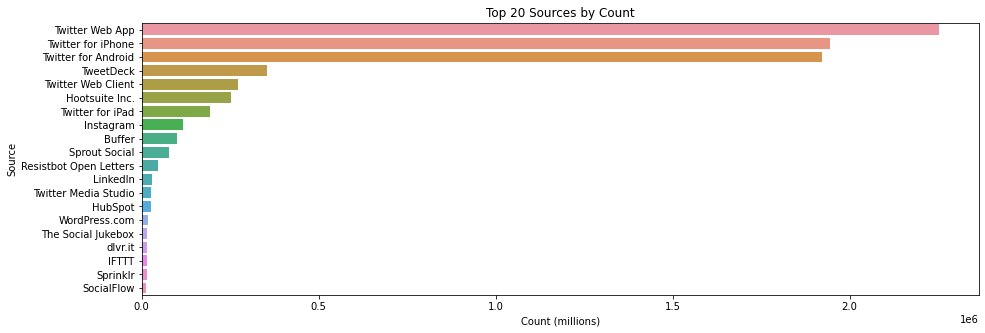

In [55]:
plt.figure(figsize=(15,5))
sns.barplot(x=tweets['source'].value_counts()[:20], y=tweets['source'].value_counts().index[:20], orient='h')
plt.title('Top 20 Sources by Count')
plt.xlabel('Count (millions)')
plt.ylabel('Source')
plt.show()

Twitter Web App is the most frequent source in the dataset (2,251,704 counts, 28%). The second and third most frequent sources are both mobile device-based - Twitter for iPhone (1,943,776 counts) and Twitter for Android (1,922,999 counts), respectively. Both constituted comparable fractions of the dataset, each making up about 24%. 

Twitter Web App, Twitter for iPhone, and Twitter for Android together consisted 76% of the entire dataset. 

## Get Tweet Frequencies of Users

Get unique user IDs.

In [56]:
unique_user_ids = tweets['user_id'].unique()
unique_user_ids.shape


(1943803,)

There are 1,943,804 unique user IDs in the dataset. 

In [57]:
tweets.groupby('user_id').size().sort_values(ascending=False)

user_id
938533034659168256     45786
289118612              14958
4913320595             14157
139283160              10095
902440729640710145      9746
                       ...  
30720345                   1
3072036223                 1
3072037279                 1
3072037849                 1
1000000083604246529        1
Length: 1943803, dtype: int64

Visualize the top 20 most frequent tweeters.

In [58]:
# get tweet count of each unique user_id, sort them in descending order
tweet_counts_by_user_id = tweets.groupby('user_id').size().sort_values(ascending=False)
# sort the user_ids in descending order of tweet counts
user_ids_by_descending_count = tweet_counts_by_user_id.index

# Create a dataframe
tweet_counts_by_user_id_df = pd.DataFrame({'tweet_count': tweet_counts_by_user_id}, index=None)
tweet_counts_by_user_id_df.reset_index(drop=False, inplace=True)

In [59]:
tweet_counts_by_user_id_df

,user_id,tweet_count
0,938533034659168256,45786
1,289118612,14958
2,4913320595,14157
3,139283160,10095
4,902440729640710145,9746
...,...,...
1943798,30720345,1
1943799,3072036223,1
1943800,3072037279,1
1943801,3072037849,1


Plot the top 20 user IDs by tweet count.

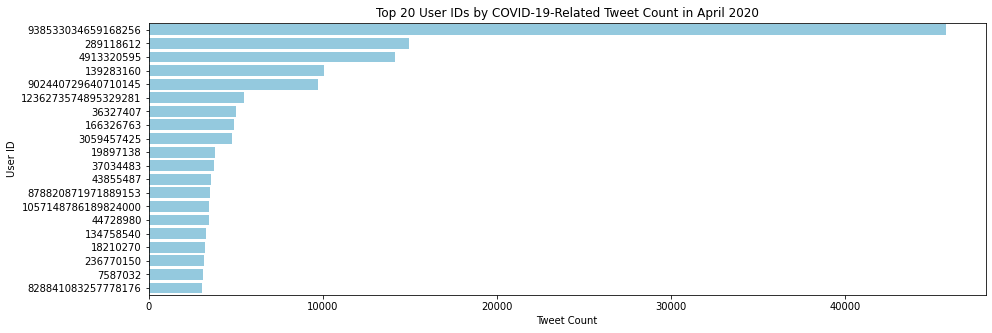

In [60]:
# Plot top 20 user IDs by tweet counts
plt.figure(figsize=(15,5))
sns.barplot(x=tweet_counts_by_user_id_df.iloc[0:20, 1], y=tweet_counts_by_user_id_df.iloc[0:20, 0], orient='h', color='skyblue')
plt.title('Top 20 User IDs by COVID-19-Related Tweet Count in April 2020')
plt.xlabel('Tweet Count')
plt.ylabel('User ID')
plt.show()

It may be better to use their screen names, instead of user IDs, to get to know them better.

In [61]:
# get number of unique screen names
tweets['screen_name'].unique().shape

(1953602,)

There are more unique screen names (1,953,602) than unique user IDs (1,943,803). If we try to match those two columns, we will get some kind of index error. 

Alternatively, we can just select top 20 screen names by tweet count to plot.

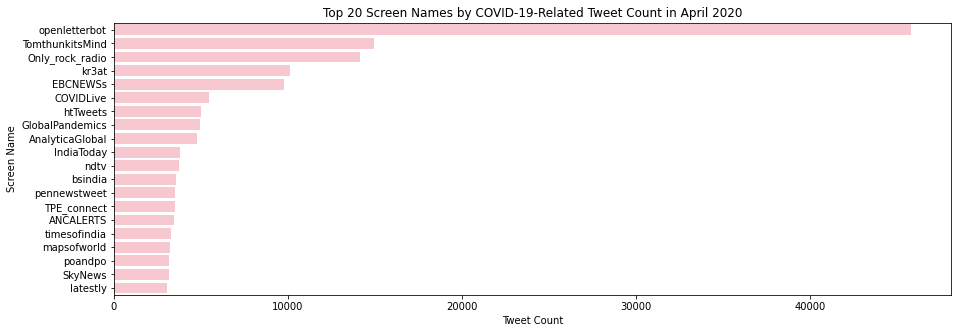

In [62]:
# get tweet count of each unique screen_name, sort them in descending order
tweet_counts_by_screen_name = tweets.groupby('screen_name').size().sort_values(ascending=False)
# sort the user_ids in descending order of tweet counts
screen_name_by_descending_count = tweet_counts_by_screen_name.index

# slice top 20 by tweet count
top_20_screen_names = screen_name_by_descending_count[:20]
top_20_tweet_counts = tweet_counts_by_screen_name[:20]

# plot
plt.figure(figsize=(15,5))
sns.barplot(x=top_20_tweet_counts, y=top_20_screen_names, orient='h', color='pink')
plt.xlabel('Tweet Count')
plt.ylabel('Screen Name')
plt.title('Top 20 Screen Names by COVID-19-Related Tweet Count in April 2020')
plt.show()

We see that the most prolific user was openletterbot, who posted more than 40,000 tweets in the month of April in 2020. Ths screen name suggests that it is actually a bot. 

In its Twitter profile, openletterbot describes itself as, "I’m a bot publishing copies of letters delivered to elected officials in the United States." 

Users, who appear to be mostly Americans, send digital copies of their letters or petitions addressed to elected officials  to the bot, and it shares a screenshot of them on its feed.

## Calculate Tweet Frequencies of Unique Users

We saw that there are more unique screen names than unique user IDs. Screen names can be set by the user, so it may allow duplicates in the ecosystem, or one user could have multiple screen names within a month. Therefore, the more reliable anchor point for calculating tweet frequency of each user would be `user_id` as it is set by Twitter, not individual users.

In [63]:
earliest_date = tweets['created_at'].dt.date.min()
latest_date = tweets['created_at'].dt.date.max()
total_timespan = (latest_date - earliest_date)
print(earliest_date, latest_date)
print(total_timespan)
# total_num_days tweets['created_at'].dt.da
# tweets.groupby('user_id').size()/



2020-03-29 2020-04-30
32 days, 0:00:00


The data spanned 32 days, from March 29th to April 30th, 2020.

In [64]:
tweets['user_id'].unique().shape

(1943803,)

Again, there are nearly 2 million unique user IDs in the dataset.

### Calculate User Tweet Frequency Per Day

In [65]:
# get the days in int format
total_num_days = total_timespan.days
display(tweets.groupby('user_id').size())
print('\n User Tweet Frequency per day:\n')
user_tweet_freq_per_day = tweets.groupby('user_id').size()/total_num_days
print(user_tweet_freq_per_day)

user_id
1000000083604246529     1
1000000662              1
1000001032401846272     1
1000001295342858241     2
1000001683005542402    15
                       ..
999997696881709056      1
999997839097913349      1
999998869214818310      1
999999669001510912      1
999999918231179266      7
Length: 1943803, dtype: int64


 User Tweet Frequency per day:

user_id
1000000083604246529    0.03125
1000000662             0.03125
1000001032401846272    0.03125
1000001295342858241    0.06250
1000001683005542402    0.46875
                        ...   
999997696881709056     0.03125
999997839097913349     0.03125
999998869214818310     0.03125
999999669001510912     0.03125
999999918231179266     0.21875
Length: 1943803, dtype: float64


### Calculate User Tweet Frequency Per Hour

In [66]:
# # calculate the total number of hours which the dataset spanned
# total_hours = total_num_days*24 
# total_hours

The dataset covered 768 hours from March 29th to April 30, 2020.

In [67]:
# # calcualte the tweet frequency per hour of each user
# user_tweet_freq_per_hour = tweets.groupby('user_id').size()/total_hours
# user_tweet_freq_per_hour

In [68]:
# # check if the indices in two series match
# (user_tweet_freq_per_day.index == user_tweet_freq_per_hour.index).all()

In [69]:
# create dataframe of user_tweet_freq_per_day and user_tweet_freq_per_hour

user_tweet_freq_df = pd.DataFrame({'user_id': user_tweet_freq_per_day.index,
                                   'user_tweet_freq_per_day': user_tweet_freq_per_day #,
                                   #'user_tweet_freq_per_hour': user_tweet_freq_per_hour
                                   }, index=None)
# fix/reset the indices
user_tweet_freq_df.reset_index(drop=True, inplace=True)

In [70]:
user_tweet_freq_df

,user_id,user_tweet_freq_per_day
0,1000000083604246529,0.03125
1,1000000662,0.03125
2,1000001032401846272,0.03125
3,1000001295342858241,0.06250
4,1000001683005542402,0.46875
...,...,...
1943798,999997696881709056,0.03125
1943799,999997839097913349,0.03125
1943800,999998869214818310,0.03125
1943801,999999669001510912,0.03125


## Add Tweet Frequency Information to the DataFrame

Let's merge this dataframe with the `tweets` dataframe.

In [71]:
tweets = tweets.merge(user_tweet_freq_df, how='left', on='user_id')
tweets

,status_id,user_id,created_at,screen_name,text,source,is_quote,is_retweet,favourites_count,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,account_created_at,verified,is_reply,time_of_day,user_tweet_freq_per_day
0,1244051645975191557,80943559,2020-03-29 00:00:00,rlieving,“People are just storing up. They are staying ...,TweetDeck,False,False,604,0,country_code NA,place_full_name NA,place_type NA,136,457,2009-10-08 21:06:08,False,0,early morning,4.18750
1,1244051646935633921,27922157,2020-03-29 00:00:00,AmerMedicalAssn,.@PatriceHarrisMD spoke with @YahooFinance abo...,Sprinklr,False,False,2894,3,country_code NA,place_full_name NA,place_type NA,714952,6877,2009-03-31 17:50:31,True,0,early morning,16.46875
2,1244051645971025920,1115874631,2020-03-29 00:00:00,CGTNOfficial,First medical team aiding #Wuhan in fight agai...,Twitter Media Studio,False,False,65,18,country_code NA,place_full_name NA,place_type NA,14040072,55,2013-01-24 03:18:59,True,0,early morning,50.65625
3,1244051647149543426,108845320,2020-03-29 00:00:00,OnTopMag,.@KathyGriffin: @realDonaldTrump Is 'Lying' Ab...,Twitter for Advertisers,False,False,2658,1,country_code NA,place_full_name NA,place_type NA,5042,5389,2010-01-27 05:23:15,False,0,early morning,3.28125
4,1244051645102579712,17673635,2020-03-29 00:00:00,livemint,#CoronaUpdate | Johns Hopkins University has s...,TweetDeck,False,False,474,2,country_code NA,place_full_name NA,place_type NA,1862858,127,2008-11-27 09:07:38,True,0,early morning,22.65625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8133301,1256010435641462784,7117302,2020-04-30 23:59:58,ozsultan,"Dear @NYCMayor,\n\nThe city has Millions to sp...",Twitter for iPhone,False,False,18897,0,country_code NA,place_full_name NA,place_type NA,8723,7747,2007-06-27 20:09:29,False,0,evening,0.53125
8133302,1256010442876608512,912319950559354880,2020-04-30 23:59:59,DriveLockGlobal,In the middle of the #COVID19 sales surge in M...,HubSpot,False,False,84,0,country_code NA,place_full_name NA,place_type NA,365,1333,2017-09-25 14:16:41,False,0,evening,0.12500
8133303,1256010442696245253,18198832,2020-04-30 23:59:59,TheScientistLLC,"While the lockdown for #COVID19 continues on, ...",HubSpot,False,False,978,1,country_code NA,place_full_name NA,place_type NA,66844,383,2008-12-17 20:32:46,True,0,evening,0.31250
8133304,1256010440154513408,937899468585828352,2020-04-30 23:59:59,portarican_RT,Best answer. #COVID19 #WeMournThemAll https://...,Twitter Web App,True,False,44903,0,country_code NA,place_full_name NA,place_type NA,5503,5909,2017-12-05 04:20:33,False,0,evening,10.87500


The number of rows is unaffeccted. Upon visual check, `user_tweet_freq_per_day` hase been added to `tweets` dataframe.

In [72]:
print('User tweet frequency per day min:', tweets['user_tweet_freq_per_day'].min())
print('User tweet frequency per day max:', tweets['user_tweet_freq_per_day'].max())
print('User tweet frequency per day mean:', tweets['user_tweet_freq_per_day'].mean())
print('User tweet frequency per day median:', tweets['user_tweet_freq_per_day'].median())
print('User tweet frequency per day standard deviation:', tweets['user_tweet_freq_per_day'].std())





User tweet frequency per day min: 0.03125
User tweet frequency per day max: 1430.8125
User tweet frequency per day mean: 14.215844646998404
User tweet frequency per day median: 0.40625
User tweet frequency per day standard deviation: 111.80857082019277


Tweet frequency per day ranges widely - from 0.03 to 1430 tweets per day. The mean frequency per day is 14.2, and the median is 0.4. The standard deviation is 111.8 tweets per day. As such, we expect to see a highly skewed distribution of tweet frequencies per day.

## Randomly Sample 10% of the Dataset

In [73]:
tweets_sample = tweets.sample(frac=0.1, random_state=44)
tweets_sample.reset_index(drop=True, inplace=True)
tweets_sample.shape

(813331, 20)

In [74]:
from sklearn.model_selection import train_test_split

In [75]:
# tweets_remainder, tweets_sample = train_test_split(tweets, test_size=0.1, random_state=0, stratify=tweets['user_id'])

# # check shape of sample
# print(f'Shape of 10% sample: {tweets_sample.shape}')

The random sample contains 813,331 rows, compared to 8+ million rows in the original dataset.

### Check Distritbution of Tweet Counts by Date

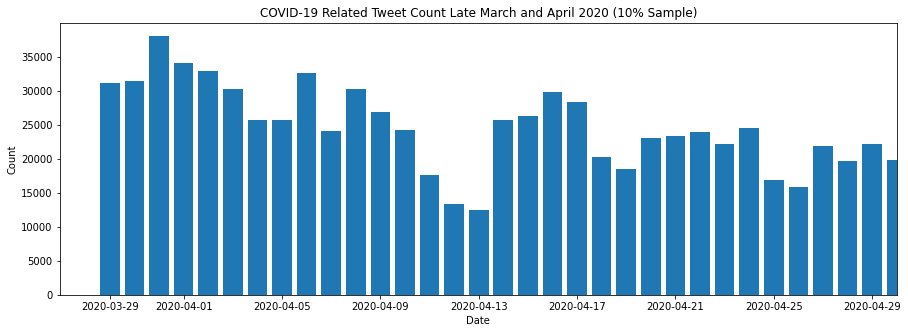

In [76]:
# get tweet count for each date in the dataset
tweet_count_by_date = tweets_sample['created_at'].dt.date.value_counts()
# sort the dates
tweet_count_by_date.sort_index()

# plot the distribution
plt.figure(figsize=(15,5))
plt.bar(tweet_count_by_date.index, tweet_count_by_date)
plt.xlim(right=max(tweet_count_by_date.index))
plt.title('COVID-19 Related Tweet Count Late March and April 2020 (10% Sample)')
plt.xlabel('Date')
plt.ylabel('Count')
plt.show()


We see very similar distribution of tweet counts to that of the original dataset.

### Check Distribution of Tweet Counts by Time of Day

In [77]:
print(f'Total number of rows: {tweets_sample.shape[0]} \n')

# Count the tweets for each time of day
tweet_count_by_time_of_day = tweets_sample.groupby('time_of_day')['time_of_day'].count()
display(tweet_count_by_time_of_day)
print('\n')

print(f'Does the sum of tweet counts match with total number of rows? {tweet_count_by_time_of_day.sum()==tweets_sample.shape[0]} \n')

# calculate the percentages (divide each count by the total number of rows and multiply by 100%)
tweet_pct_by_time_of_day = tweets_sample.groupby('time_of_day')['time_of_day'].count()/tweets_sample.shape[0]*100
tweet_pct_by_time_of_day

# Order the times of day and corresponding counts before plotting
times_of_day = ['early morning', 'morning', 'afternoon', 'evening']
tweet_count_by_time_of_day_ordered = []
for time in times_of_day:
  tweet_count_by_time_of_day_ordered.append(tweet_count_by_time_of_day[time])

# Visualize
fig = px.bar(x=times_of_day, y=tweet_count_by_time_of_day_ordered,
             title='COVID-19 Tweet Counts by Time of Day (10% Sample)',
             labels={'x': 'Time of Day', 'y': 'Tweet Count'},
             width=600, height=400)
fig.show()

Total number of rows: 813331 



time_of_day
afternoon        278539
early morning    138005
evening          225956
morning          170831
Name: time_of_day, dtype: int64



Does the sum of tweet counts match with total number of rows? True 



The distribution of tweet count throughout the day is comparable to that of the entire dataset. 

### Check Top Users by Tweet Count

Let's check if the top users by tweet count are comparable to the original dataset.

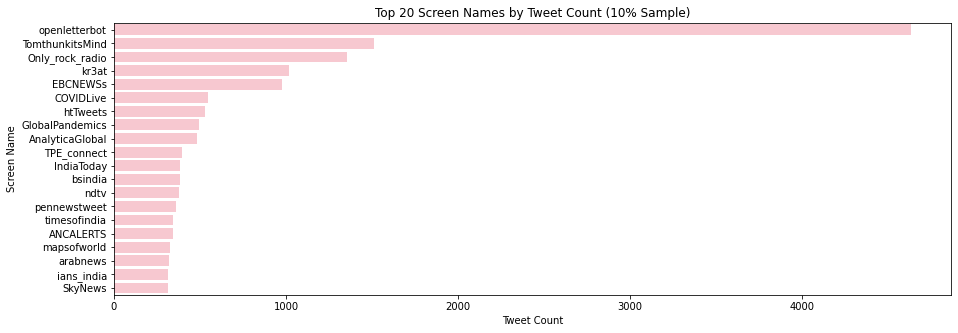

In [78]:
# get tweet count of each unique screen_name, sort them in descending order
tweet_counts_by_screen_name = tweets_sample.groupby('screen_name').size().sort_values(ascending=False)
# sort the user_ids in descending order of tweet counts
screen_name_by_descending_count = tweet_counts_by_screen_name.index

# slice top 20 by tweet count
top_20_screen_names = screen_name_by_descending_count[:20]
top_20_tweet_counts = tweet_counts_by_screen_name[:20]

# plot
plt.figure(figsize=(15,5))
sns.barplot(x=top_20_tweet_counts, y=top_20_screen_names, orient='h', color='pink')
plt.xlabel('Tweet Count')
plt.ylabel('Screen Name')
plt.title('Top 20 Screen Names by Tweet Count (10% Sample)')
plt.show()

We see that the top users by tweet count in this 10% random sample were also top users in the original dataset.

### Check Top 20 Sources

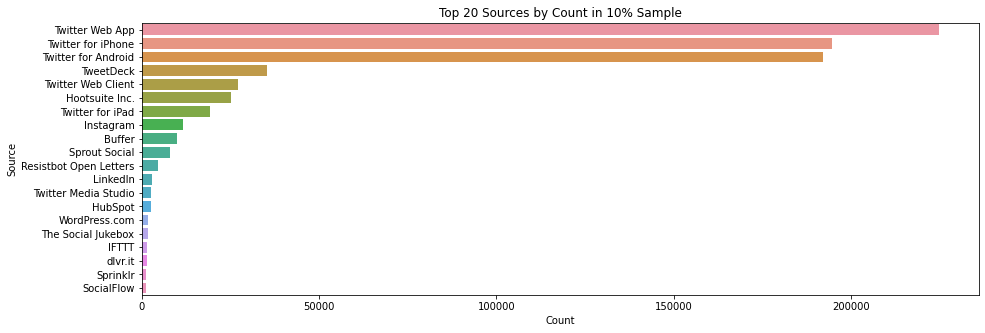

In [79]:
plt.figure(figsize=(15,5))
sns.barplot(x=tweets_sample['source'].value_counts()[:20], 
            y=tweets_sample['source'].value_counts().index[:20], 
            orient='h')
plt.title('Top 20 Sources by Count in 10% Sample')
plt.xlabel('Count')
plt.ylabel('Source')
plt.show()

The distribution of sources in this 10% sample is comparable to that of the original dataset. The most frequent sources are still Twitter Web App, Twitter for iPhone, and Twitter for Android.

In [80]:
tweets_sample['screen_name'].nunique()

434790

In [81]:
tweets_sample['created_at'].dt.date.head()

0    2020-04-02
1    2020-04-15
2    2020-04-30
3    2020-04-25
4    2020-04-01
Name: created_at, dtype: object

## Text Cleaning

Before performing any modeling, we need to clean up the text in the tweets. They may contain URLs, images, videos, hashtags, etc. We will remove URLs, images, videos, and emojis. However, we will separate the hashtags and mentions and put them in different columns.

After we clean up the text and create new column with just hashtags and mentions, we will vectorize them to make them numeric data before modeling.

In [82]:
# tweets_sample

## Extract Hashtags and Mentions (SCRAP - Don't run upon restart)

`tweet-preprocessor` will be used to clean the tweets. The library is widely used for preprocessing tweets before performing machine learning models. 

In [83]:
# # source: https://pypi.org/project/tweet-preprocessor/
# !pip install tweet-preprocessor
# import preprocessor as p

In [84]:
# tweets

In [85]:
# test_text = 'Preprocessor is #awesome #great_job #hello @realDonaldTrump@JohnSmith'
# parsed_text = p.parse(test_text)

In [86]:
# parsed_text

In [87]:
# parsed_text.hashtags

In [88]:
# parsed_text.mentions

In [89]:
# mentions = ''
# for i in range(len(parsed_text.mentions)):
#   mentions += f'{parsed_text.mentions[i].match} '

# mentions

In [90]:
# for i, v in enumerate(tweets['text'].head(10)):
#   print(i,v)

In [91]:
# test_tweets = tweets_sample[:10]
# test_tweets

In [92]:
# test_tweets['hashtags'] = ''
# test_tweets['mentions'] = ''
# test_tweets

In [93]:
# test_tweets.loc[0, 'text']

In [94]:
# # enumerate index and text of each row
# for i, t in enumerate(test_tweets['text']):
#   # for each row, concatenate string of mentions and string of hashtags
#   mentions=''
#   hashtags=''
#   # parse the text
#   parsed_text = p.parse(t)
#   # if there are mentions
#   if parsed_text.mentions != None:
#     # loop through mentions object which is a list
#     for j in range(len(parsed_text.mentions)):
#       # concatenate to mentions string
#       mentions += f'{parsed_text.mentions[j].match} '
      
#   # if there are hashtags
#   if parsed_text.hashtags != None:
#     # loop through hashtags object which is a list
#     for k in range(len(parsed_text.hashtags)):
#       # concatenate each hashtag to hashtags string  
#       hashtags += f'{parsed_text.hashtags[k].match} '

#   # update the row values
#   test_tweets.loc[i, 'mentions'] = mentions
#   test_tweets.loc[i, 'hashtags'] = hashtags
#    # print(mentions, hashtags)

In [95]:
# test_tweets

In [96]:
# tweets_sample_8000 = tweets_sample.sample(8000)
# tweets_sample_8000.reset_index(drop=True, inplace=True)

In [97]:
# tweets_sample_8000['mentions'] = ''
# tweets_sample_8000['hashtags'] = ''

# from tqdm import tqdm
# # enumerate index and text of each row
# for i, t in tqdm(enumerate(tweets_sample_8000['text'])):
#   #print(f'Working on row index {i}', end='\r')
  
#   # for each row, concatenate string of mentions and string of hashtags
#   mentions=''
#   hashtags=''
#   # parse the text
#   parsed_text = p.parse(t)
#   # if there are mentions
#   if parsed_text.mentions != None:
#     # loop through mentions object which is a list
#     for j in range(len(parsed_text.mentions)):
#       # concatenate to mentions string
#       mentions += f'{parsed_text.mentions[j].match} '
      
#   # if there are hashtags
#   if parsed_text.hashtags != None:
#     # loop through hashtags object which is a list
#     for k in range(len(parsed_text.hashtags)):
#       # concatenate each hashtag to hashtags string  
#       hashtags += f'{parsed_text.hashtags[k].match} '

#   # update the row values
#   tweets_sample_8000.loc[i, 'mentions'] = mentions
#   tweets_sample_8000.loc[i, 'hashtags'] = hashtags

In [98]:
# tweets_sample_8000.head()

In [99]:
# # create new columns for hashtags and mentions
# # populate them with empty strings for now
# tweets_sample['mentions'] = ''
# tweets_sample['hashtags'] = ''

# from tqdm import tqdm
# # enumerate index and text of each row
# for i, t in tqdm(enumerate(tweets_sample['text'])):
#   #print(f'Working on row index {i}', end='\r')
  
#   # for each row, concatenate string of mentions and string of hashtags
#   mentions=''
#   hashtags=''
#   # parse the text
#   parsed_text = p.parse(t)
#   # if there are mentions
#   if parsed_text.mentions != None:
#     # loop through mentions object which is a list
#     for j in range(len(parsed_text.mentions)):
#       # concatenate to mentions string
#       mentions += f'{parsed_text.mentions[j].match} '
      
#   # if there are hashtags
#   if parsed_text.hashtags != None:
#     # loop through hashtags object which is a list
#     for k in range(len(parsed_text.hashtags)):
#       # concatenate each hashtag to hashtags string  
#       hashtags += f'{parsed_text.hashtags[k].match} '

#   # update the row values
#   tweets_sample.loc[i, 'mentions'] = mentions
#   tweets_sample.loc[i, 'hashtags'] = hashtags
#    # print(mentions, hashtags)


Maybe do it in chunks of 100,000? 

In [100]:
# tweets_sample

In [101]:
# def extract_hashtags(text):
#   parsed_text = p.parse(text)
#   mentions=''
  
#   # parse the text
#   parsed_text = p.parse(t)
#   # if there are mentions
#   if parsed_text.mentions != None:
#     # loop through mentions object which is a list
#     for j in range(len(parsed_text.mentions)):
#       # concatenate to mentions string
#       mentions += f'{parsed_text.mentions[j].match} '

#   return mentions


# def extract_mentions(text):
#   hashtags = ''
#   parsed_text = p.parse(text)
#   # if there are hashtags
#   if parsed_text.hashtags != None:
#     # loop through hashtags object which is a list
#     for k in range(len(parsed_text.hashtags)):
#       # concatenate each hashtag to hashtags string  
#       hashtags += f'{parsed_text.hashtags[k].match} '
#   return hashtags 

In [102]:
# tweets_sample['mention'] = ''
# mask = p.parse(tweets_sample['text'])

Preprocessing with texacy: https://textacy.readthedocs.io/en/latest/api_reference/preprocessing.html

In [103]:
# tweets_sample.head()

In [104]:
# tweets_sample[500000:500020]

In [105]:
# test_tweets.to_csv('/content/drive/MyDrive/BrainStation/Capstone/test_tweets.csv')

In [106]:
# df = pd.read_csv('/content/drive/MyDrive/BrainStation/Capstone/test_tweets.csv',index_col=0, header=0)
# df

### end of junk/scrapping
---

## Count Vectorize 



### 10% Random Sample from the 10% Sample (1% of Total)

The 10% random sample from the original dataset contains more than 800,000 tweets. The sample size is still too large when it comes to runtimes and memory usage, especially considering how many columns will be added after One Hot Encoding and CountVectorizing.

Let's take another 10% random sample from this sample to get the number of rows down to about 80,000.

In [107]:
tweets_small_sample = tweets_sample.sample(frac=0.1, random_state=44)
tweets_small_sample.shape

(81333, 20)

The sample now contains 81,333 tweets and 21 columns.

In [108]:
# preview
tweets_small_sample.head()

,status_id,user_id,created_at,screen_name,text,source,is_quote,is_retweet,favourites_count,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,account_created_at,verified,is_reply,time_of_day,user_tweet_freq_per_day
214016,1246317814534647810,279822752,2020-04-04 06:04:57,alostvoicefound,We've decided to name this little girl Cora Ti...,Twitter for Android,False,False,16341,0,country_code NA,place_full_name NA,place_type NA,1205,1029,2011-04-10 02:52:10,False,0,morning,0.03125
139986,1251798223276122112,470036016,2020-04-19 09:02:08,BillWilliams01,Ha! @michaelgove now backtracking on the “prom...,Twitter for iPhone,False,False,22888,0,GB,"Camberwell, London",city,1978,1906,2012-01-21 08:01:47,False,0,morning,0.31250
754715,1244361937581944833,138177160,2020-03-29 20:32:59,HillRogerJ,.@FEMA_Pete @SecAzar: the US faces a severe #...,Twitter Web Client,False,False,228,0,country_code NA,place_full_name NA,place_type NA,156,58,2010-04-28 21:03:17,False,0,evening,0.09375
448755,1245343717067829250,1112030120477450240,2020-04-01 13:34:14,humberto_herb,@AndrewHolnessJM #covid19 There are doctors an...,Twitter Web App,False,False,26936,0,country_code NA,place_full_name NA,place_type NA,334,1751,2019-03-30 16:33:36,False,1,afternoon,1.43750
163873,1252918702166638592,2346990325,2020-04-22 11:14:31,SikaRudzi,Painful to learn of another #Covid19 related f...,Twitter for Android,True,False,2929,0,country_code NA,place_full_name NA,place_type NA,140,157,2014-02-16 15:02:47,False,0,morning,0.09375


The indices need to be reset.

In [109]:
# reset index
tweets_small_sample.reset_index(drop=True, inplace=True)

In [110]:
# verify
tweets_small_sample.head()

,status_id,user_id,created_at,screen_name,text,source,is_quote,is_retweet,favourites_count,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,account_created_at,verified,is_reply,time_of_day,user_tweet_freq_per_day
0,1246317814534647810,279822752,2020-04-04 06:04:57,alostvoicefound,We've decided to name this little girl Cora Ti...,Twitter for Android,False,False,16341,0,country_code NA,place_full_name NA,place_type NA,1205,1029,2011-04-10 02:52:10,False,0,morning,0.03125
1,1251798223276122112,470036016,2020-04-19 09:02:08,BillWilliams01,Ha! @michaelgove now backtracking on the “prom...,Twitter for iPhone,False,False,22888,0,GB,"Camberwell, London",city,1978,1906,2012-01-21 08:01:47,False,0,morning,0.31250
2,1244361937581944833,138177160,2020-03-29 20:32:59,HillRogerJ,.@FEMA_Pete @SecAzar: the US faces a severe #...,Twitter Web Client,False,False,228,0,country_code NA,place_full_name NA,place_type NA,156,58,2010-04-28 21:03:17,False,0,evening,0.09375
3,1245343717067829250,1112030120477450240,2020-04-01 13:34:14,humberto_herb,@AndrewHolnessJM #covid19 There are doctors an...,Twitter Web App,False,False,26936,0,country_code NA,place_full_name NA,place_type NA,334,1751,2019-03-30 16:33:36,False,1,afternoon,1.43750
4,1252918702166638592,2346990325,2020-04-22 11:14:31,SikaRudzi,Painful to learn of another #Covid19 related f...,Twitter for Android,True,False,2929,0,country_code NA,place_full_name NA,place_type NA,140,157,2014-02-16 15:02:47,False,0,morning,0.09375


The indices for our 1% random sample have been reset.

#### Check Distribution

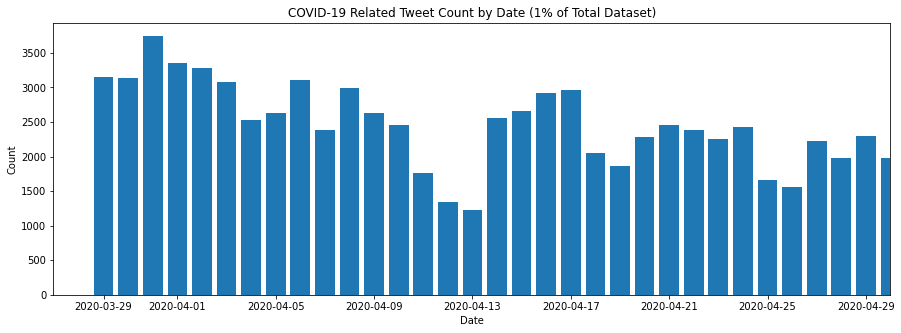

In [111]:
# get tweet count for each date in the dataset
tweet_count_by_date = tweets_small_sample['created_at'].dt.date.value_counts()
# sort the dates
tweet_count_by_date.sort_index()

# plot the distribution
plt.figure(figsize=(15,5))
plt.bar(tweet_count_by_date.index, tweet_count_by_date)
plt.xlim(right=max(tweet_count_by_date.index))
plt.title('COVID-19 Related Tweet Count by Date (1% of Total Dataset)')
plt.xlabel('Date')
plt.ylabel('Count')
plt.show()

The distribution of tweet counts by date is very similar to that of the original dataset as well as to the first 10% sample that contained about 800,000 tweets.

Export this 1% sample as csv file so in case we want to start from scratch, we don't have to re-run the whole notebook.


In [112]:
# export this 1% sample as csv file so in case we want to start from scratch, we don't have to run the whole notebook
tweets_small_sample.to_csv('/content/drive/MyDrive/BrainStation/Capstone/tweets_1pct_sample.csv')

### Extract Hashtags and Mentions (Skip)

In [113]:
# import re
# # extract hashtags and mentions from the tweet texts
# # put them in new columns called 'hashtags' and 'mentions
# tweets_sample_1_pct['hashtags'] = tweets_sample_1_pct['text'].apply(lambda x: re.findall(r"#(\w+)", x))
# tweets_sample_1_pct['mentions'] = tweets_sample_1_pct['text'].apply(lambda x: re.findall(r"@(\w+)", x))

In [114]:
# tweets_sample_1_pct

### DROP HASHTAGS AND MENTIOSN COLS FOR NOW

In [115]:
# tweets_sample_1_pct.drop(columns=['mentions', 'hashtags'], inplace=True)

### CountVectorizer

In [116]:
tweets_small_sample.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81333 entries, 0 to 81332
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   status_id                81333 non-null  object        
 1   user_id                  81333 non-null  object        
 2   created_at               81333 non-null  datetime64[ns]
 3   screen_name              81333 non-null  object        
 4   text                     81333 non-null  object        
 5   source                   81333 non-null  object        
 6   is_quote                 81333 non-null  bool          
 7   is_retweet               81333 non-null  bool          
 8   favourites_count         81333 non-null  int64         
 9   retweet_count            81333 non-null  int64         
 10  country_code             81333 non-null  object        
 11  place_full_name          81333 non-null  object        
 12  place_type               81333 n

There are no missing values.

Note that we will need to convert the non-numeric features to numeric before modeling down the line, say, using One Hot Encoder. But, let's focus on count vectorization for now.

In [117]:
from sklearn.feature_extraction.text import CountVectorizer

In [118]:
bagofwords = CountVectorizer(stop_words='english',
                             min_df=200,
                             max_df=0.95)
bagofwords.fit(tweets_small_sample['text'])

# tokenize/vectorize the text
text_vectorized = bagofwords.transform(tweets_small_sample['text'])

print(f'Shape of vectorzied tweet texts: {text_vectorized.shape}')


Shape of vectorzied tweet texts: (81333, 947)


- `min_df`: ignore terms that appear less than the given frequency (ex. min_df=200 means ignore terms that appear in fewer than 200 documents)

- `max_df`: ignore terms that appear more than the given frequency (ex. max_df=0.95 means ignore terms that appear in more than 95% of the documents)

With min_df=200 and max_df=0.95, 947 tokens have been extracted.



In [119]:
# source: BrainStation
def plot_most_frequent(words, word_counts, top=20):
    '''
    INPUTS
    - words: words that were vectorized from a column
    - word_counts: count of each word (frequency)
    - top: specify the number of most frequent words to show from most to least
    - column_name: the column from which the tokens were vectorized

    OUTPUTS
    - matplotlib plot of frequency for each word (number of words specified by top parameter)
    '''
    words_df = pd.DataFrame({"Token": words, 
                             "Count": word_counts})
    
    fig, ax = plt.subplots(figsize=(0.75*top, 5))
    words_df.sort_values(by="Count", ascending=False).head(top)\
        .set_index("Token")\
        .plot(kind="bar", rot=45, ax=ax)
    sns.despine()
    plt.title(f"Most Frequent Words", fontsize=24)
    plt.ylabel("Count", fontsize=20)
    plt.xlabel("Token", fontsize=20)
    plt.savefig('/content/drive/MyDrive/BrainStation/Capstone/most_freq_words.png')
    plt.show()

Plot the 20 most frequent tokens/words.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



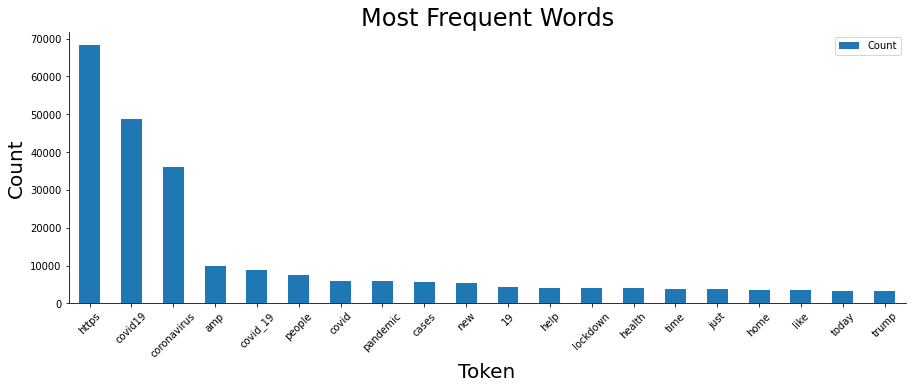

In [120]:
words = bagofwords.get_feature_names()
word_counts = text_vectorized.toarray().sum(axis=0)
# plot top 20 most frequent words
plot_most_frequent(words, word_counts)

We see that "https" is the most frequent word. This is because each tweet ends with a URL link to the tweet. We may need to remove URLs and other artifacts that we do not want.

Let's lower the `max_df` and re-run the vectorizer.

In [121]:
bagofwords = CountVectorizer(stop_words='english',
                             min_df=200,
                             max_df=0.40)
bagofwords.fit(tweets_small_sample['text'])

text_vectorized = bagofwords.transform(tweets_small_sample['text'])

print(f'Shape of vectorzied tweet texts: {text_vectorized.shape}')

Shape of vectorzied tweet texts: (81333, 944)


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



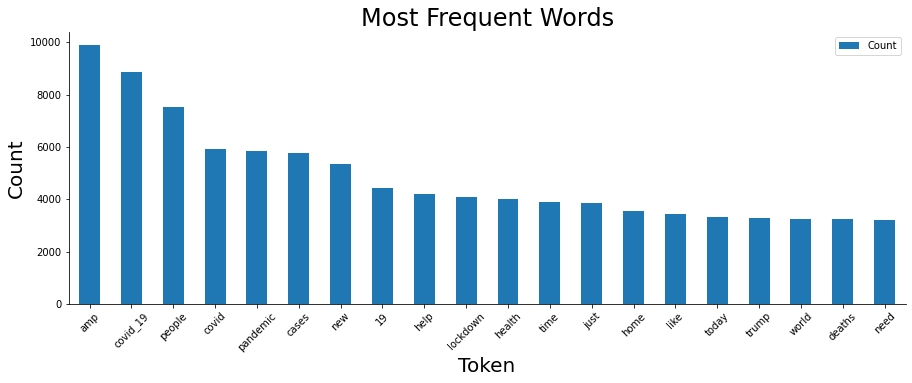

In [122]:
words = bagofwords.get_feature_names()
word_counts = text_vectorized.toarray().sum(axis=0)
# plot top 20 most frequent words
plot_most_frequent(words, word_counts)

Many of the top 20 words are related to COVID-19 (e.g., "covid_19", "pandemic", "19", "lockdown", "health", etc.). Interestingly, or perhaps unsurprisingly, "trump" is one of the most frequently tweeted word. Note that CountVectorizer converts every word into lowercase. Therefore, it is most likely that "trump" stems from "Trump".

However, the most frequent word is "amp". Let's investigate this further.

In [123]:
substring = 'amp'
# pull out a few tweets that contains "amp"
contains_amp = tweets_small_sample.loc[tweets_small_sample['text'].str.contains(substring)]
contains_amp.reset_index(drop=True, inplace=True)
contains_amp['text']

0       "In this lockdown, these people in the communi...
1       Chronology samajhiye!\n\n1. #ShaheenBagh\n2. #...
2       @PaulDelaware @JohnJHarwood @VP Fortunately (r...
3       My husband &amp; daughter @LucieLcarter  take ...
4       N95 with CE &amp; FDA \n#n95mask #protectivema...
                              ...                        
8708    Be Ready to #fightcovid19\n#thankyouheroes #do...
8709    @adamboultonSKY @MattHancock Ya don't say...\n...
8710    Under cover of a global pandemic with no parli...
8711    Updated graph of confirmed and presumptive US ...
8712    EP 024: "Primal Advice &amp; Cosmic Dice"  The...
Name: text, Length: 8713, dtype: object

There are close to 9,000 tweets that contain "amp". 

Pull a couple of these tweets and see in what context "amp" comes from.

In [124]:
contains_amp['text'][0]

'"In this lockdown, these people in the community suffer the most and they are faced with two hazards #coronavirus &amp; #poverty because they are unable to get any work during the lockdown period and they do not have any savings so that they can spend it now"\nhttps://t.co/0lj4jJTQSf'

In [125]:
contains_amp['text'][4]

'N95 with CE &amp; FDA \n#n95mask #protectivemasks #CE #FDA #cronavirus #covid19 https://t.co/XKFkvpZ74F'

Some of these tweets contain "&amp;". This is how "&" gets encoded when scraping. We do not know if this will be important in detecting bots. Therefore, we will refrain from dropping tokens at this point. Instead, we will perform KMeans clustering to see how the clusters come out at this point.

## KMeans Clustering

Make a pandas dataframe of `text_vectorized` so that it can be concatenated with tweets_small_sample. 

Prefix "t_" will be added to each token so that we can easily tell these features originated from count vectorization.

In [126]:
# make df of the vectorized words
text_vectorized_df = pd.DataFrame(columns=bagofwords.get_feature_names(), data=text_vectorized.toarray())

# add prefix to the tokens to indicate that they came from CountVectorizing
text_vectorized_df = text_vectorized_df.add_prefix('t_') # add prefix t_

# preview teh dataframe
display(text_vectorized_df.head())
# check shape
print(f'Shape of text_vectorized_df: {text_vectorized_df.shape}')

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



,t_00,t_000,t_04,t_10,t_100,t_11,t_12,t_13,t_14,t_15,t_16,t_17,t_18,t_19,t_1st,t_20,t_200,t_2019,t_2020,t_21,t_22,t_23,t_24,t_25,t_26,t_27,t_28,t_29,t_30,t_40,t_45,t_50,t_500,t_60,t_able,t_absolutely,t_access,t_according,t_account,t_act,...,t_watching,t_water,t_way,t_ways,t_wear,t_wearing,t_webinar,t_website,t_week,t_weekend,t_weeks,t_went,t_white,t_whitehouse,t_win,t_wish,t_woman,t_women,t_won,t_wonder,t_word,t_words,t_work,t_workers,t_working,t_works,t_world,t_worldwide,t_worse,t_worst,t_worth,t_wrong,t_wuhan,t_year,t_years,t_yes,t_yesterday,t_york,t_young,t_youtube
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Shape of text_vectorized_df: (81333, 944)


In [127]:
# concatenate the two dfs column-wise (axis=1)
tweets_small_sample_vectorized = pd.concat([tweets_small_sample, text_vectorized_df], axis=1)

# preview
display(tweets_small_sample_vectorized.head())

# shape
print(f'Shape of concatenated tweets_small_sample_vectorized: {tweets_small_sample_vectorized.shape}')

,status_id,user_id,created_at,screen_name,text,source,is_quote,is_retweet,favourites_count,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,account_created_at,verified,is_reply,time_of_day,user_tweet_freq_per_day,t_00,t_000,t_04,t_10,t_100,t_11,t_12,t_13,t_14,t_15,t_16,t_17,t_18,t_19,t_1st,t_20,t_200,t_2019,t_2020,t_21,...,t_watching,t_water,t_way,t_ways,t_wear,t_wearing,t_webinar,t_website,t_week,t_weekend,t_weeks,t_went,t_white,t_whitehouse,t_win,t_wish,t_woman,t_women,t_won,t_wonder,t_word,t_words,t_work,t_workers,t_working,t_works,t_world,t_worldwide,t_worse,t_worst,t_worth,t_wrong,t_wuhan,t_year,t_years,t_yes,t_yesterday,t_york,t_young,t_youtube
0,1246317814534647810,279822752,2020-04-04 06:04:57,alostvoicefound,We've decided to name this little girl Cora Ti...,Twitter for Android,False,False,16341,0,country_code NA,place_full_name NA,place_type NA,1205,1029,2011-04-10 02:52:10,False,0,morning,0.03125,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1251798223276122112,470036016,2020-04-19 09:02:08,BillWilliams01,Ha! @michaelgove now backtracking on the “prom...,Twitter for iPhone,False,False,22888,0,GB,"Camberwell, London",city,1978,1906,2012-01-21 08:01:47,False,0,morning,0.31250,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1244361937581944833,138177160,2020-03-29 20:32:59,HillRogerJ,.@FEMA_Pete @SecAzar: the US faces a severe #...,Twitter Web Client,False,False,228,0,country_code NA,place_full_name NA,place_type NA,156,58,2010-04-28 21:03:17,False,0,evening,0.09375,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1245343717067829250,1112030120477450240,2020-04-01 13:34:14,humberto_herb,@AndrewHolnessJM #covid19 There are doctors an...,Twitter Web App,False,False,26936,0,country_code NA,place_full_name NA,place_type NA,334,1751,2019-03-30 16:33:36,False,1,afternoon,1.43750,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1252918702166638592,2346990325,2020-04-22 11:14:31,SikaRudzi,Painful to learn of another #Covid19 related f...,Twitter for Android,True,False,2929,0,country_code NA,place_full_name NA,place_type NA,140,157,2014-02-16 15:02:47,False,0,morning,0.09375,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Shape of concatenated tweets_small_sample: (81333, 964)


The number of rows is unchanged, as expected. The number of columns is now 966 (20 initial columns + 944 tokens = 964). 

### Add `account_age` Feature

We can use `created_at` and `account_created_at` to calcualte the age of the account at the time of tweeting. We will add these values to a new column called `account_age`. The rationale is that bot accounts may had been created recently than human-owned accounts.


In [132]:
 # calculate the account age at the time of tweeting
account_age = tweets_small_sample['created_at'] - tweets_small_sample['account_created_at']

# extract only the days and add them to a new col called account_age
tweets_small_sample_vectorized['account_age'] = account_age.dt.days

# check
tweets_small_sample_vectorized['account_age']

0        3282
1        3011
2        3622
3         367
4        2256
         ... 
81328     393
81329    2591
81330    2736
81331    1830
81332      10
Name: account_age, Length: 81333, dtype: int64

In [134]:
tweets_small_sample_vectorized.head()

,status_id,user_id,created_at,screen_name,text,source,is_quote,is_retweet,favourites_count,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,account_created_at,verified,is_reply,time_of_day,user_tweet_freq_per_day,t_00,t_000,t_04,t_10,t_100,t_11,t_12,t_13,t_14,t_15,t_16,t_17,t_18,t_19,t_1st,t_20,t_200,t_2019,t_2020,t_21,...,t_water,t_way,t_ways,t_wear,t_wearing,t_webinar,t_website,t_week,t_weekend,t_weeks,t_went,t_white,t_whitehouse,t_win,t_wish,t_woman,t_women,t_won,t_wonder,t_word,t_words,t_work,t_workers,t_working,t_works,t_world,t_worldwide,t_worse,t_worst,t_worth,t_wrong,t_wuhan,t_year,t_years,t_yes,t_yesterday,t_york,t_young,t_youtube,account_age
0,1246317814534647810,279822752,2020-04-04 06:04:57,alostvoicefound,We've decided to name this little girl Cora Ti...,Twitter for Android,False,False,16341,0,country_code NA,place_full_name NA,place_type NA,1205,1029,2011-04-10 02:52:10,False,0,morning,0.03125,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3282
1,1251798223276122112,470036016,2020-04-19 09:02:08,BillWilliams01,Ha! @michaelgove now backtracking on the “prom...,Twitter for iPhone,False,False,22888,0,GB,"Camberwell, London",city,1978,1906,2012-01-21 08:01:47,False,0,morning,0.31250,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3011
2,1244361937581944833,138177160,2020-03-29 20:32:59,HillRogerJ,.@FEMA_Pete @SecAzar: the US faces a severe #...,Twitter Web Client,False,False,228,0,country_code NA,place_full_name NA,place_type NA,156,58,2010-04-28 21:03:17,False,0,evening,0.09375,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3622
3,1245343717067829250,1112030120477450240,2020-04-01 13:34:14,humberto_herb,@AndrewHolnessJM #covid19 There are doctors an...,Twitter Web App,False,False,26936,0,country_code NA,place_full_name NA,place_type NA,334,1751,2019-03-30 16:33:36,False,1,afternoon,1.43750,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,367
4,1252918702166638592,2346990325,2020-04-22 11:14:31,SikaRudzi,Painful to learn of another #Covid19 related f...,Twitter for Android,True,False,2929,0,country_code NA,place_full_name NA,place_type NA,140,157,2014-02-16 15:02:47,False,0,morning,0.09375,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2256


`account_age` feature has been added to `tweets_small_sample_vectorized`.

### Convert Non-Numeric Columns into Numeric Columns

Let's review the non-numeric columns again.

In [128]:
tweets_small_sample.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81333 entries, 0 to 81332
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   status_id                81333 non-null  object        
 1   user_id                  81333 non-null  object        
 2   created_at               81333 non-null  datetime64[ns]
 3   screen_name              81333 non-null  object        
 4   text                     81333 non-null  object        
 5   source                   81333 non-null  object        
 6   is_quote                 81333 non-null  bool          
 7   is_retweet               81333 non-null  bool          
 8   favourites_count         81333 non-null  int64         
 9   retweet_count            81333 non-null  int64         
 10  country_code             81333 non-null  object        
 11  place_full_name          81333 non-null  object        
 12  place_type               81333 n

Let's see how many features each geo-tag-related column would add if One Hot Encoded.

In [129]:
# get number of unique values for geo-tag related information
unique_country_codes = tweets_small_sample['country_code'].nunique()
unique_place_types = tweets_small_sample['place_type'].nunique()
unique_place_full_names = tweets_small_sample['place_full_name'].nunique()

print(f'Number of unique country codes: {unique_country_codes}')
print(f'Number of unique place types: {unique_place_types}')
print(f'Number of unique place full names: {unique_place_full_names}')


Number of unique country codes: 114
Number of unique place types: 6
Number of unique place full names: 1738


Check the sixv unique place types.

In [130]:
tweets_small_sample['place_type'].unique()

array(['place_type NA', 'city', 'country', 'admin', 'poi', 'neighborhood'],
      dtype=object)

As mentioned before, most of the tweets will have `place_type NA` because they were not geo-tagged.

At this juncture, we have to think about how we will interpret the results after we pass in the data to a clustering algorithm. We may have to perform dimensionalirty reduction as well, which would make interpretation more difficult.

We want to be able see the tweets in each cluster to determine how they are clustered. This will become difficult when we only pass in the vectorized tokens to the algorithm. 

To be able to retrace the observations in a cluster back to tweets, we will need some kind of indices in a some sort of dictionary that maps indices to the original tweets.

To do so, we will store `status_id`, `user_id`, `text`, `screen_name`, `created_at`, and `account_created_at` separately from the dataframe that will be passed into the algorithm. The indices between these two dataframes will be the same, allowing us to later map the tweets to the clustered data points.

In [138]:
# store the text and associated IDs in tweets_map 
tweets_map = tweets_small_sample_vectorized[['status_id', 'user_id', 'created_at', 'text', 'screen_name', 'account_created_at']]
print(f'tweets_map shape: {tweets_map.shape}')
tweets_map.head()

tweets_map shape: (81333, 6)


,status_id,user_id,created_at,text,screen_name,account_created_at
0,1246317814534647810,279822752,2020-04-04 06:04:57,We've decided to name this little girl Cora Ti...,alostvoicefound,2011-04-10 02:52:10
1,1251798223276122112,470036016,2020-04-19 09:02:08,Ha! @michaelgove now backtracking on the “prom...,BillWilliams01,2012-01-21 08:01:47
2,1244361937581944833,138177160,2020-03-29 20:32:59,.@FEMA_Pete @SecAzar: the US faces a severe #...,HillRogerJ,2010-04-28 21:03:17
3,1245343717067829250,1112030120477450240,2020-04-01 13:34:14,@AndrewHolnessJM #covid19 There are doctors an...,humberto_herb,2019-03-30 16:33:36
4,1252918702166638592,2346990325,2020-04-22 11:14:31,Painful to learn of another #Covid19 related f...,SikaRudzi,2014-02-16 15:02:47


Save `tweets_map` as a csv file.

In [232]:
tweets_map.to_csv('/content/drive/MyDrive/BrainStation/Capstone/tweets_map.csv')

Now that the important columns are stored in `tweets_map`, we can drop them in `tweets_small_sample_vectorized` so that it can be passed in to a clustering algorithm.

In [139]:
# drop created_at, status_id, user_id, screen_name, text, account_created_at
tweets_small_sample_vectorized.drop(['created_at', 'status_id', 'user_id', 'screen_name',
                                     'text', 'account_created_at'], axis=1,
                                    inplace=True)

In [140]:
# check
print(f'shape of tweets_small_sample_vectorized: {tweets_small_sample_vectorized.shape}')
tweets_small_sample_vectorized.head(3)

shape of tweets_small_sample_vectorized: (81333, 959)


,source,is_quote,is_retweet,favourites_count,retweet_count,country_code,place_full_name,place_type,followers_count,friends_count,verified,is_reply,time_of_day,user_tweet_freq_per_day,t_00,t_000,t_04,t_10,t_100,t_11,t_12,t_13,t_14,t_15,t_16,t_17,t_18,t_19,t_1st,t_20,t_200,t_2019,t_2020,t_21,t_22,t_23,t_24,t_25,t_26,t_27,...,t_water,t_way,t_ways,t_wear,t_wearing,t_webinar,t_website,t_week,t_weekend,t_weeks,t_went,t_white,t_whitehouse,t_win,t_wish,t_woman,t_women,t_won,t_wonder,t_word,t_words,t_work,t_workers,t_working,t_works,t_world,t_worldwide,t_worse,t_worst,t_worth,t_wrong,t_wuhan,t_year,t_years,t_yes,t_yesterday,t_york,t_young,t_youtube,account_age
0,Twitter for Android,False,False,16341,0,country_code NA,place_full_name NA,place_type NA,1205,1029,False,0,morning,0.03125,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3282
1,Twitter for iPhone,False,False,22888,0,GB,"Camberwell, London",city,1978,1906,False,0,morning,0.31250,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3011
2,Twitter Web Client,False,False,228,0,country_code NA,place_full_name NA,place_type NA,156,58,False,0,evening,0.09375,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3622


Let's drop `place_type` which can be implied from `place_full_name`.

In [144]:
# drop place_type
tweets_small_sample_vectorized.drop('place_type', axis=1, inplace=True)

In [146]:
# check
tweets_small_sample_vectorized.head(1)

,source,is_quote,is_retweet,favourites_count,retweet_count,country_code,place_full_name,followers_count,friends_count,verified,is_reply,time_of_day,user_tweet_freq_per_day,t_00,t_000,t_04,t_10,t_100,t_11,t_12,t_13,t_14,t_15,t_16,t_17,t_18,t_19,t_1st,t_20,t_200,t_2019,t_2020,t_21,t_22,t_23,t_24,t_25,t_26,t_27,t_28,...,t_water,t_way,t_ways,t_wear,t_wearing,t_webinar,t_website,t_week,t_weekend,t_weeks,t_went,t_white,t_whitehouse,t_win,t_wish,t_woman,t_women,t_won,t_wonder,t_word,t_words,t_work,t_workers,t_working,t_works,t_world,t_worldwide,t_worse,t_worst,t_worth,t_wrong,t_wuhan,t_year,t_years,t_yes,t_yesterday,t_york,t_young,t_youtube,account_age
0,Twitter for Android,0,0,16341,0,country_code NA,place_full_name NA,1205,1029,0,0,morning,0.03125,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3282


`place_type` has been dropped.

In [154]:
# check dtypes
tweets_small_sample_vectorized.iloc[:,:20].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81333 entries, 0 to 81332
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   source                   81333 non-null  object 
 1   is_quote                 81333 non-null  int64  
 2   is_retweet               81333 non-null  int64  
 3   favourites_count         81333 non-null  int64  
 4   retweet_count            81333 non-null  int64  
 5   country_code             81333 non-null  object 
 6   place_full_name          81333 non-null  object 
 7   followers_count          81333 non-null  int64  
 8   friends_count            81333 non-null  int64  
 9   verified                 81333 non-null  int64  
 10  is_reply                 81333 non-null  int64  
 11  time_of_day              81333 non-null  object 
 12  user_tweet_freq_per_day  81333 non-null  float64
 13  t_00                     81333 non-null  int64  
 14  t_000                 

Before One Hot Encoding the remaining `object` type columns, we will convert the `bool` type columns into `int` type.

In [142]:
tweets_small_sample_vectorized['is_quote'] = tweets_small_sample_vectorized['is_quote'].astype(int)
tweets_small_sample_vectorized['is_retweet'] = tweets_small_sample_vectorized['is_retweet'].astype(int)
tweets_small_sample_vectorized['verified'] =tweets_small_sample_vectorized['verified'].astype(int)

# check dtypes
tweets_small_sample_vectorized.iloc[:,:20].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81333 entries, 0 to 81332
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   source                   81333 non-null  object 
 1   is_quote                 81333 non-null  int64  
 2   is_retweet               81333 non-null  int64  
 3   favourites_count         81333 non-null  int64  
 4   retweet_count            81333 non-null  int64  
 5   country_code             81333 non-null  object 
 6   place_full_name          81333 non-null  object 
 7   place_type               81333 non-null  object 
 8   followers_count          81333 non-null  int64  
 9   friends_count            81333 non-null  int64  
 10  verified                 81333 non-null  int64  
 11  is_reply                 81333 non-null  int64  
 12  time_of_day              81333 non-null  object 
 13  user_tweet_freq_per_day  81333 non-null  float64
 14  t_00                  

The boolean columns have been converted to `int64` columns.

### One Hot Encoding

Let's One Hot Encode `source`, `country_code`, `place_full_name`, and `time_of_day`.

In [150]:
from sklearn.preprocessing import OneHotEncoder

In [158]:
def my_ohe_converter(series, prefix=''):
  '''
  -INPUT-
  series: pandas series of categorical column
  prefix: prefix you want to add in front of every encoded feature
    default is empty string

  -OUTPUT-
  pandas dataframe of one hot encoded matrix (it will be dense)
  '''
  # instantiate
  ohe = OneHotEncoder()
  # ohe expects a 2D array, so first convert it to dataframe
  subcategory = pd.DataFrame(series)

  # one hot encode
  encoded = ohe.fit_transform(subcategory)

  # convert the sparse matrix to dense array before making it a dataframe
  dense_array = encoded.toarray()
  # make it a dataframe
  encoded_df = pd.DataFrame(dense_array, columns = ohe.categories_, dtype=int)
  # add prefix
  encoded_df = encoded_df.add_prefix(prefix)

  return encoded_df

One Hot Encode `source` column.

In [159]:
# One Hot Encode source
source_series = tweets_small_sample_vectorized['source']
source_prefix = 'source_'
source_encoded_df = my_ohe_converter(source_series, source_prefix)

# check
print(f'shape of source_encoded_df: {source_encoded_df.shape}')
# preview
display(source_encoded_df.head(3))

shape of source_encoded_df: (81333, 589)


,source_1News Tweet Bot,source_1buvtw,source_24liveblog,source_365twpost2,source_@thedextazlab,source_A Bright Fire Posts,source_ALCOVID19,source_Africa News Hub,source_Africa Newsroom,source_Agenparl,source_Agent3 SoSell,source_AgoraPulse Manager,source_Aiir,source_Alexander Higgins,source_AmazingContent,source_Amazon USA,source_AnimeTwitBot,source_App Political Hispanic,source_App for IconicHipster.com,source_App for healthybuilds,source_Apphi,source_Appleinsider.com,source_AudioburstPublisher,source_Auto tweets,source_AvonSocial,source_BHIVE Nectar,source_BLOX CMS,source_BSPN twitter bots,source_BT03,source_BTCNbot,source_Back At You Media,source_Bambu by Sprout Social,source_Best COVID19 Threads,source_Bird Netting,source_BitlBee,source_Bitly,source_Bizcommunity.com,source_Blaq for BlackBerry® 10,source_Blog2Social APP,source_Bloglovin,...,source_nwindianabusiness.com,source_oneindia entertainment,source_organiZm :: Network,source_ospublisher,source_oysttyer,source_paulcrypto,source_peetm,source_pfff_shop,source_pillowy mounds,source_posteador_ruby,source_preprint-alert,source_presshub_usbot,source_prion,source_rate_twitte,source_read an tweet,source_readdme,source_recurpost.com,source_remote.io,source_responsibot,source_socialandtech.net,source_splessons,source_startbitcoinclick,source_t_client_cli_neilellis,source_thecovidude,source_themanwiththehat.de,source_thevirustracker,source_tiorradio1 publisher,source_tiorradio2 publisher,source_tiorradio3 publisher,source_tprzechlewski.app,source_trackingbot2020,source_trump covid tracker,source_trumpDigest,source_tweetbotoutsys,source_twittbot.net,source_ukniptweeter,source_uwf.london,source_vadenuevo,source_vitalanon wordpress,source_Оwly
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


589 features have been One Hot Encoded from `source` column.

One Hot Encode `country_code` column.

In [160]:
# convert country_code
country_code_series = tweets_small_sample_vectorized['country_code']
country_code_prefix = 'country_'
country_code_encoded_df = my_ohe_converter(country_code_series, country_code_prefix)

# check
print(f'shape of country_code_encoded_df: {country_code_encoded_df.shape}')
# preview
display(country_code_encoded_df.head(3))

shape of country_code_encoded_df: (81333, 114)


,country_AE,country_AF,country_AL,country_AO,country_AT,country_AU,country_BD,country_BE,country_BH,country_BJ,country_BM,country_BO,country_BR,country_BS,country_BW,country_BZ,country_CA,country_CD,country_CH,country_CI,country_CN,country_CO,country_CY,country_CZ,country_DE,country_DJ,country_DK,country_EC,country_EG,country_ES,country_ET,country_FI,country_FJ,country_FR,country_GB,country_GE,country_GH,country_GM,country_GR,country_GT,...,country_NL,country_NO,country_NP,country_NZ,country_OM,country_PA,country_PE,country_PH,country_PK,country_PL,country_PT,country_QA,country_RS,country_RW,country_SA,country_SC,country_SE,country_SG,country_SI,country_SK,country_SL,country_SN,country_SO,country_SX,country_TG,country_TH,country_TN,country_TR,country_TT,country_TW,country_TZ,country_UG,country_US,country_UY,country_VN,country_XK,country_ZA,country_ZM,country_ZW,country_country_code NA
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


114 features have been encoded from `country_code` column.

One Hot Encode `place_full_name` column.

In [163]:
# convert time_of_day
place_full_name_series = tweets_small_sample_vectorized['place_full_name']
place_full_name_prefix = 'place_'
place_full_name_encoded_df = my_ohe_converter(place_full_name_series,
                                              place_full_name_prefix)

# check
print(f'shape of place_full_name_encoded_df: {place_full_name_encoded_df.shape}')
# preview
display(place_full_name_encoded_df.head(3))

shape of place_full_name_encoded_df: (81333, 1738)


,"place_Abbotsford, British Columbia","place_Aberdeen, Scotland","place_Abiko-shi, Chiba","place_Absecon, NJ","place_Abu Dhabi, United Arab Emirates","place_Abuja, Nigeria","place_Accra, Ghana",place_Action Chapel (The Eagles Nest)Comm 2,"place_Adamawa, Nigeria","place_Adana, Türkiye","place_Addison, TX","place_Addo, Nigeria","place_Adelaide, South Australia",place_Afghanistan,"place_Agadir, Morocco","place_Agartala, India","place_Agdal, Royaume du Maroc","place_Agra, India","place_Aguascalientes, México","place_Ahmadabad City, India","place_Ajmer, India",place_Ajmera Infinity Clubhouse,"place_Akasia, South Africa","place_Akola, India","place_Akron, OH","place_Al Khobar, Kingdom of Saudi Arabia","place_Al Madinah Al Munawwarah, Kingdom of Saudi Arabia","place_Al Qar'a, Kingdom of Saudi Arabia","place_Al Salmiyah, Kuwait","place_Alabama, USA","place_Alafaya, FL","place_Alagbado, Nigeria","place_Alaska, USA",place_Albania,"place_Alberton, South Africa","place_Albuquerque, NM","place_Alexandria, VA","place_Algonquin, IL","place_Aligarh, India","place_Allahabad, India",...,"place_Wisconsin, USA","place_Wodonga, Victoria","place_Woking, South East","place_Wolf Trap, VA","place_Woodbury, MN","place_Woodport, NJ","place_Woonsocket, RI","place_Wooster, OH","place_Worcester, England","place_Worcester, MA","place_Worthing, England","place_Wrexham, Wales","place_Wymondham, England","place_Wyndmoor, PA","place_Yate, England","place_Yokosuka-shi, Kanagawa","place_Yongin-si, Republic of Korea","place_Yongsan-gu, Republic of Korea","place_Yonkers, NY","place_York, England","place_Yorkshire and The Humber, England","place_Yorktown Heights, NY","place_Yulee, FL","place_Yuma, AZ","place_Zhejiang, People's Republic of China",place_Zimbabwe,"place_Zionsville, IN","place_Zurich, Switzerland",place_adilabad,place_akure,place_kurnool,place_murree expressway,place_new york city,place_place_full_name NA,place_taconic ct,"place_Ålesund, Norway","place_İstanbul, Türkiye",place_กรุงเทพมหานคร (Bangkok),place_双良集团有限公司,place_源森川水門
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0


1,738 features have been encoded from `place_full_name` column.

One Hot Encode `time_of_day` column.

In [162]:
# convert time_of_day
time_of_day_series = tweets_small_sample_vectorized['time_of_day']
time_of_day_prefix = 'time_'
time_of_day_encoded_df = my_ohe_converter(time_of_day_series, time_of_day_prefix)

# check
print(f'shape of time_of_day_encoded_df: {time_of_day_encoded_df.shape}')
# preview
display(time_of_day_encoded_df.head(3))

shape of time_of_day_encoded_df: (81333, 4)


,time_afternoon,time_early morning,time_evening,time_morning
0,0,0,0,1
1,0,0,0,1
2,0,0,1,0


4 features (early morning, morning, afternoon, evening) have been extracted from `time_of_day` column.

Concatenate the One Hot Encoded features with `tweets_small_sample_vectorized` and remove redundant columns. Assign the concatenated dataframe to `tweets_prepped`.

In [165]:
tweets_prepped = pd.concat([tweets_small_sample_vectorized,
                            source_encoded_df,
                            country_code_encoded_df,
                            place_full_name_encoded_df,
                            time_of_day_encoded_df], axis=1)

# check
print(f'Shape of tweets_prepped: {tweets_prepped.shape}')
tweets_prepped.head()

Shape of tweets_prepped: (81333, 3403)


,source,is_quote,is_retweet,favourites_count,retweet_count,country_code,place_full_name,followers_count,friends_count,verified,is_reply,time_of_day,user_tweet_freq_per_day,t_00,t_000,t_04,t_10,t_100,t_11,t_12,t_13,t_14,t_15,t_16,t_17,t_18,t_19,t_1st,t_20,t_200,t_2019,t_2020,t_21,t_22,t_23,t_24,t_25,t_26,t_27,t_28,...,"(place_Woodbury, MN,)","(place_Woodport, NJ,)","(place_Woonsocket, RI,)","(place_Wooster, OH,)","(place_Worcester, England,)","(place_Worcester, MA,)","(place_Worthing, England,)","(place_Wrexham, Wales,)","(place_Wymondham, England,)","(place_Wyndmoor, PA,)","(place_Yate, England,)","(place_Yokosuka-shi, Kanagawa,)","(place_Yongin-si, Republic of Korea,)","(place_Yongsan-gu, Republic of Korea,)","(place_Yonkers, NY,)","(place_York, England,)","(place_Yorkshire and The Humber, England,)","(place_Yorktown Heights, NY,)","(place_Yulee, FL,)","(place_Yuma, AZ,)","(place_Zhejiang, People's Republic of China,)","(place_Zimbabwe,)","(place_Zionsville, IN,)","(place_Zurich, Switzerland,)","(place_adilabad,)","(place_akure,)","(place_kurnool,)","(place_murree expressway,)","(place_new york city,)","(place_place_full_name NA,)","(place_taconic ct,)","(place_Ålesund, Norway,)","(place_İstanbul, Türkiye,)","(place_กรุงเทพมหานคร (Bangkok),)","(place_双良集团有限公司,)","(place_源森川水門,)","(time_afternoon,)","(time_early morning,)","(time_evening,)","(time_morning,)"
0,Twitter for Android,0,0,16341,0,country_code NA,place_full_name NA,1205,1029,0,0,morning,0.03125,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
1,Twitter for iPhone,0,0,22888,0,GB,"Camberwell, London",1978,1906,0,0,morning,0.31250,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,Twitter Web Client,0,0,228,0,country_code NA,place_full_name NA,156,58,0,0,evening,0.09375,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
3,Twitter Web App,0,0,26936,0,country_code NA,place_full_name NA,334,1751,0,1,afternoon,1.43750,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
4,Twitter for Android,1,0,2929,0,country_code NA,place_full_name NA,140,157,0,0,morning,0.09375,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1


Drop the columns that have been One Hot Encoded.

In [166]:
tweets_prepped.drop(['source', 'country_code', 'place_full_name', 'time_of_day'],
                    axis=1,
                    inplace=True)

In [168]:
# check
print(f'Shape of tweets_prepped: {tweets_prepped.shape}')
display(tweets_prepped.info())
tweets_prepped.head()

Shape of tweets_prepped: (81333, 3399)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81333 entries, 0 to 81332
Columns: 3399 entries, is_quote to ('time_morning',)
dtypes: float64(1), int64(3398)
memory usage: 2.1 GB


None

,is_quote,is_retweet,favourites_count,retweet_count,followers_count,friends_count,verified,is_reply,user_tweet_freq_per_day,t_00,t_000,t_04,t_10,t_100,t_11,t_12,t_13,t_14,t_15,t_16,t_17,t_18,t_19,t_1st,t_20,t_200,t_2019,t_2020,t_21,t_22,t_23,t_24,t_25,t_26,t_27,t_28,t_29,t_30,t_40,t_45,...,"(place_Woodbury, MN,)","(place_Woodport, NJ,)","(place_Woonsocket, RI,)","(place_Wooster, OH,)","(place_Worcester, England,)","(place_Worcester, MA,)","(place_Worthing, England,)","(place_Wrexham, Wales,)","(place_Wymondham, England,)","(place_Wyndmoor, PA,)","(place_Yate, England,)","(place_Yokosuka-shi, Kanagawa,)","(place_Yongin-si, Republic of Korea,)","(place_Yongsan-gu, Republic of Korea,)","(place_Yonkers, NY,)","(place_York, England,)","(place_Yorkshire and The Humber, England,)","(place_Yorktown Heights, NY,)","(place_Yulee, FL,)","(place_Yuma, AZ,)","(place_Zhejiang, People's Republic of China,)","(place_Zimbabwe,)","(place_Zionsville, IN,)","(place_Zurich, Switzerland,)","(place_adilabad,)","(place_akure,)","(place_kurnool,)","(place_murree expressway,)","(place_new york city,)","(place_place_full_name NA,)","(place_taconic ct,)","(place_Ålesund, Norway,)","(place_İstanbul, Türkiye,)","(place_กรุงเทพมหานคร (Bangkok),)","(place_双良集团有限公司,)","(place_源森川水門,)","(time_afternoon,)","(time_early morning,)","(time_evening,)","(time_morning,)"
0,0,0,16341,0,1205,1029,0,0,0.03125,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
1,0,0,22888,0,1978,1906,0,0,0.31250,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,0,0,228,0,156,58,0,0,0.09375,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
3,0,0,26936,0,334,1751,0,1,1.43750,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
4,1,0,2929,0,140,157,0,0,0.09375,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1


There are 81,333 rows and 3,399 columns/features. Only numeric data types remain - `float64` and `int64`.

Note that some of the feature names are in tuples (e.g., `(place_adilabad,)`). We need to fix them by selecting the first element in each tuple and setting that as the column name.

In [172]:
# fix the column names in tuples
new_features = []
for col in tweets_prepped.columns:
  if isinstance(col, tuple):
    # if column name is a tuple, select the first element
    col = col[0]
    new_features.append(col)
  else:
    # if column name is normal, then just keep using it
    new_features.append(col)

tweets_prepped.columns = new_features


Check the column names.

In [173]:
tweets_prepped.head()

,is_quote,is_retweet,favourites_count,retweet_count,followers_count,friends_count,verified,is_reply,user_tweet_freq_per_day,t_00,t_000,t_04,t_10,t_100,t_11,t_12,t_13,t_14,t_15,t_16,t_17,t_18,t_19,t_1st,t_20,t_200,t_2019,t_2020,t_21,t_22,t_23,t_24,t_25,t_26,t_27,t_28,t_29,t_30,t_40,t_45,...,"place_Woodbury, MN","place_Woodport, NJ","place_Woonsocket, RI","place_Wooster, OH","place_Worcester, England","place_Worcester, MA","place_Worthing, England","place_Wrexham, Wales","place_Wymondham, England","place_Wyndmoor, PA","place_Yate, England","place_Yokosuka-shi, Kanagawa","place_Yongin-si, Republic of Korea","place_Yongsan-gu, Republic of Korea","place_Yonkers, NY","place_York, England","place_Yorkshire and The Humber, England","place_Yorktown Heights, NY","place_Yulee, FL","place_Yuma, AZ","place_Zhejiang, People's Republic of China",place_Zimbabwe,"place_Zionsville, IN","place_Zurich, Switzerland",place_adilabad,place_akure,place_kurnool,place_murree expressway,place_new york city,place_place_full_name NA,place_taconic ct,"place_Ålesund, Norway","place_İstanbul, Türkiye",place_กรุงเทพมหานคร (Bangkok),place_双良集团有限公司,place_源森川水門,time_afternoon,time_early morning,time_evening,time_morning
0,0,0,16341,0,1205,1029,0,0,0.03125,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
1,0,0,22888,0,1978,1906,0,0,0.31250,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,0,0,228,0,156,58,0,0,0.09375,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
3,0,0,26936,0,334,1751,0,1,1.43750,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
4,1,0,2929,0,140,157,0,0,0.09375,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1


The column names have been fixed.

Export this dataframeas a csv file for later use. Save it as "tweets_prepped_1pct.csv".

In [207]:
# save it as tweets_prepped_1pct.csv
tweets_prepped.to_csv('/content/drive/MyDrive/BrainStation/Capstone/tweets_prepped_1pct.csv')

In [ ]:
# # instantiate one hot encoder
# ohe = OneHotEncoder()

# # ohe expects a 2D array input
# screen_name = pd.DataFrame(tweets_small_sample_vectorized['screen_name'])

# # fit and transform
# screen_name = ohe.fit_transform(screen_name)
# screen_name.shape



66,439 unique screen names have been one hot encoded.

In [ ]:
# screen_name_dense = screen_name.toarray()
# screen_name_dense.head()

### This code crashed because of memory usage!!

The kernel crashed while densifying the one hot encoded screen names. It contains more than 66,000 columns, which would undoubtedly put burden on the memory. It may make sense to once again random sample from this sample size.

Let's random sample 30% from this sample of 81,333 tweets. This would trim the number of rows down to about 24,400 rows. 

#### Random Sample 30% from tweets_small_sample_vectorized

In [ ]:
tweets_small_sample_vectorized2 = tweets_small_sample_vectorized.sample(frac=0.30, random_state=22)

# get shape
print(f'Shape of new smaller sample: {tweets_small_sample_vectorized2.shape}')

# preview new sample
tweets_small_sample_vectorized2.head()

Shape of new smaller sample: (24400, 959)


,screen_name,source,is_quote,is_retweet,favourites_count,retweet_count,country_code,followers_count,friends_count,verified,is_reply,time_of_day,user_tweet_freq_per_day,user_tweet_freq_per_hour,t_00,t_000,t_04,t_10,t_100,t_11,t_12,t_13,t_14,t_15,t_16,t_17,t_18,t_19,t_1st,t_20,t_200,t_2019,t_2020,t_21,t_22,t_23,t_24,t_25,t_26,t_27,...,t_water,t_way,t_ways,t_wear,t_wearing,t_webinar,t_website,t_week,t_weekend,t_weeks,t_went,t_white,t_whitehouse,t_win,t_wish,t_woman,t_women,t_won,t_wonder,t_word,t_words,t_work,t_workers,t_working,t_works,t_world,t_worldwide,t_worse,t_worst,t_worth,t_wrong,t_wuhan,t_year,t_years,t_yes,t_yesterday,t_york,t_young,t_youtube,account_age
30352,TrumpTruth_2020,Twitter Web App,0,0,14,0,country_code NA,1136,1226,0,1,early morning,0.06250,0.002604,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,913
21145,issafrica,Hootsuite Inc.,0,0,8,0,country_code NA,30480,167,1,0,early morning,4.96875,0.207031,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3918
56075,MeghaaGhosh,Twitter for Android,0,0,5103,0,country_code NA,8413,424,0,0,afternoon,0.37500,0.015625,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3928
14884,khotsohlangus,Twitter for Android,0,0,607,0,ZA,77,483,0,0,afternoon,0.03125,0.001302,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,2748
61488,AlArabiya_Eng,Sprinklr,0,0,0,2,country_code NA,833027,40,1,0,evening,74.71875,3.113281,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4069


This sample has 24,400 rows and 959 columns. Let's reset the indices before proceeding.

In [ ]:
tweets_small_sample_vectorized2.reset_index(drop=True, inplace=True)

In [ ]:
# check index
tweets_small_sample_vectorized2.tail()

,screen_name,source,is_quote,is_retweet,favourites_count,retweet_count,country_code,followers_count,friends_count,verified,is_reply,time_of_day,user_tweet_freq_per_day,user_tweet_freq_per_hour,t_00,t_000,t_04,t_10,t_100,t_11,t_12,t_13,t_14,t_15,t_16,t_17,t_18,t_19,t_1st,t_20,t_200,t_2019,t_2020,t_21,t_22,t_23,t_24,t_25,t_26,t_27,...,t_water,t_way,t_ways,t_wear,t_wearing,t_webinar,t_website,t_week,t_weekend,t_weeks,t_went,t_white,t_whitehouse,t_win,t_wish,t_woman,t_women,t_won,t_wonder,t_word,t_words,t_work,t_workers,t_working,t_works,t_world,t_worldwide,t_worse,t_worst,t_worth,t_wrong,t_wuhan,t_year,t_years,t_yes,t_yesterday,t_york,t_young,t_youtube,account_age
24395,cmaconthehill,Twitter Web App,0,0,1181,1,country_code NA,12463,2960,1,1,afternoon,7.59375,0.316406,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3344
24396,Martin_Stillman,Twitter for iPhone,0,0,10,0,AU,410,383,0,0,morning,0.31250,0.013021,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2787
24397,NovemberMan_11,Twitter Web App,0,0,149,0,country_code NA,20,244,0,1,evening,0.12500,0.005208,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1714
24398,Epilepsy_2020,Twitter Web App,0,0,170,1,country_code NA,409,801,0,0,morning,0.34375,0.014323,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,933
24399,NASCIO,TweetDeck,0,0,6241,0,country_code NA,6954,630,0,0,evening,0.37500,0.015625,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4080


The indices have been reset.

Let's check the distributions.

In [ ]:
# Count the tweets for each time of day
tweet_count_by_time_of_day = tweets_small_sample_vectorized2.groupby('time_of_day')['time_of_day'].count()
display(tweet_count_by_time_of_day)
print('\n')

print(f'Does the sum of tweet counts match with total number of rows? {tweet_count_by_time_of_day.sum()==tweets_sample.shape[0]} \n')

# calculate the percentages (divide each count by the total number of rows and multiply by 100%)
tweet_pct_by_time_of_day = tweets_small_sample_vectorized2.groupby('time_of_day')['time_of_day'].count()/tweets_sample.shape[0]*100
tweet_pct_by_time_of_day

# Order the times of day and corresponding counts before plotting
times_of_day = ['early morning', 'morning', 'afternoon', 'evening']
tweet_count_by_time_of_day_ordered = []
for time in times_of_day:
  tweet_count_by_time_of_day_ordered.append(tweet_count_by_time_of_day[time])

# Visualize
fig = px.bar(x=times_of_day, y=tweet_count_by_time_of_day_ordered,
             title='COVID-19 Tweet Counts by Time of Day (24,400 Sample)',
             labels={'x': 'Time of Day', 'y': 'Tweet Count'},
             width=600, height=400)
fig.show()

time_of_day
afternoon        8421
early morning    4103
evening          6777
morning          5099
Name: time_of_day, dtype: int64



Does the sum of tweet counts match with total number of rows? False 



The distribution of tweet counts across the different times of day is comparable to previous samples as well as the original dataset.

Let's check the top users by tweet count.

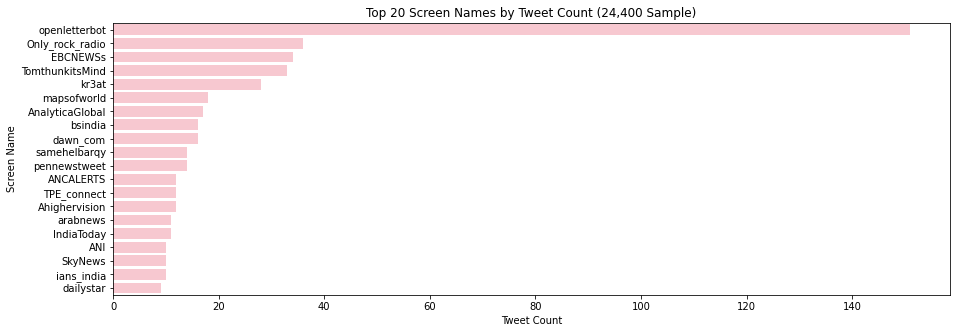

In [ ]:
# get tweet count of each unique screen_name, sort them in descending order
tweet_counts_by_screen_name = tweets_small_sample_vectorized2.groupby('screen_name').size().sort_values(ascending=False)
# sort the user_ids in descending order of tweet counts
screen_name_by_descending_count = tweet_counts_by_screen_name.index

# slice top 20 by tweet count
top_20_screen_names = screen_name_by_descending_count[:20]
top_20_tweet_counts = tweet_counts_by_screen_name[:20]

# plot
plt.figure(figsize=(15,5))
sns.barplot(x=top_20_tweet_counts, y=top_20_screen_names, orient='h', color='pink')
plt.xlabel('Tweet Count')
plt.ylabel('Screen Name')
plt.title('Top 20 Screen Names by Tweet Count (24,400 Sample)')
plt.show()

Still, the most prolific tweeter is openletterbot. The rankings of the rest of the users changed slightly but not by huge margins.

Let's check the top 20 sources.

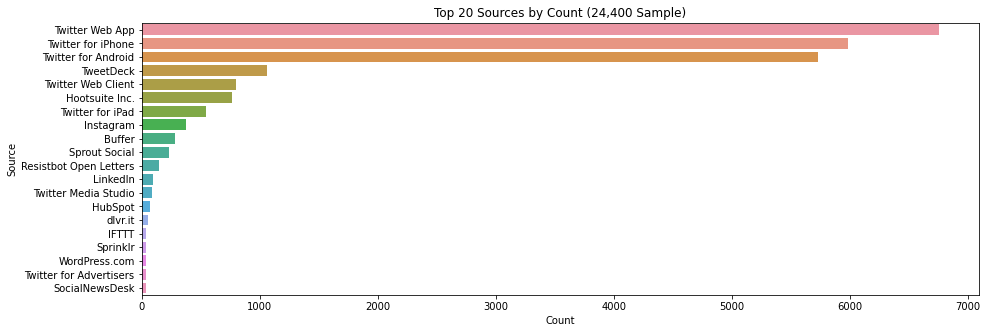

In [ ]:
# plot top 20 sources
plt.figure(figsize=(15,5))
sns.barplot(x=tweets_small_sample_vectorized2['source'].value_counts()[:20], 
            y=tweets_small_sample_vectorized2['source'].value_counts().index[:20], 
            orient='h')
plt.title('Top 20 Sources by Count (24,400 Sample)')
plt.xlabel('Count')
plt.ylabel('Source')
plt.show()

The rankings of most frequently used sources generally did not change.

Overall, this sample appears to be fairly representative of the original dataset.

In [ ]:
tweets_small_sample_vectorized2

,screen_name,source,is_quote,is_retweet,favourites_count,retweet_count,country_code,followers_count,friends_count,verified,is_reply,time_of_day,user_tweet_freq_per_day,user_tweet_freq_per_hour,t_00,t_000,t_04,t_10,t_100,t_11,t_12,t_13,t_14,t_15,t_16,t_17,t_18,t_19,t_1st,t_20,t_200,t_2019,t_2020,t_21,t_22,t_23,t_24,t_25,t_26,t_27,...,t_water,t_way,t_ways,t_wear,t_wearing,t_webinar,t_website,t_week,t_weekend,t_weeks,t_went,t_white,t_whitehouse,t_win,t_wish,t_woman,t_women,t_won,t_wonder,t_word,t_words,t_work,t_workers,t_working,t_works,t_world,t_worldwide,t_worse,t_worst,t_worth,t_wrong,t_wuhan,t_year,t_years,t_yes,t_yesterday,t_york,t_young,t_youtube,account_age
0,TrumpTruth_2020,Twitter Web App,0,0,14,0,country_code NA,1136,1226,0,1,early morning,0.06250,0.002604,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,913
1,issafrica,Hootsuite Inc.,0,0,8,0,country_code NA,30480,167,1,0,early morning,4.96875,0.207031,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3918
2,MeghaaGhosh,Twitter for Android,0,0,5103,0,country_code NA,8413,424,0,0,afternoon,0.37500,0.015625,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3928
3,khotsohlangus,Twitter for Android,0,0,607,0,ZA,77,483,0,0,afternoon,0.03125,0.001302,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,2748
4,AlArabiya_Eng,Sprinklr,0,0,0,2,country_code NA,833027,40,1,0,evening,74.71875,3.113281,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4069
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24395,cmaconthehill,Twitter Web App,0,0,1181,1,country_code NA,12463,2960,1,1,afternoon,7.59375,0.316406,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3344
24396,Martin_Stillman,Twitter for iPhone,0,0,10,0,AU,410,383,0,0,morning,0.31250,0.013021,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2787
24397,NovemberMan_11,Twitter Web App,0,0,149,0,country_code NA,20,244,0,1,evening,0.12500,0.005208,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1714
24398,Epilepsy_2020,Twitter Web App,0,0,170,1,country_code NA,409,801,0,0,morning,0.34375,0.014323,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,933


In [ ]:
def my_ohe_converter(series, prefix=''):
  '''
  -INPUT-
  series: pandas series of categorical column
  prefix: prefix you want to add in front of every encoded feature
    default is empty string

  -OUTPUT-
  pandas dataframe of one hot encoded matrix (it will be dense)
  '''
  # instantiate
  ohe = OneHotEncoder()
  # ohe expects a 2D array, so first convert it to dataframe
  subcategory = pd.DataFrame(series)

  # one hot encode
  encoded = ohe.fit_transform(subcategory)

  # convert the sparse matrix to dense array before making it a dataframe
  dense_array = encoded.toarray()
  # make it a dataframe
  encoded_df = pd.DataFrame(dense_array, columns = ohe.categories_, dtype=int)
  # add prefix
  encoded_df = encoded_df.add_prefix(prefix)

  return encoded_df



Using the above function let's convert the non-numeric columns into numeric columns.

In [ ]:
# convert screen_name to numeric columns
# screen_name_series = tweets_small_sample_vectorized2['screen_name']
# screen_name_prefix = 'name_'
# screen_name_encoded_df = my_ohe_converter(screen_name_series, screen_name_prefix)

# # check
# print(f'shape of screen_name_encoded_df: {screen_name_encoded_df.shape}')
# # preview
# display(screen_name_encoded_df.head(3))

# convert source
source_series = tweets_small_sample_vectorized2['source']
source_prefix = 'source_'
source_encoded_df = my_ohe_converter(source_series, source_prefix)

# check
print(f'shape of source_encoded_df: {source_encoded_df.shape}')
# preview
display(source_encoded_df.head(3))

# convert country_code
country_code_series = tweets_small_sample_vectorized2['country_code']
country_code_prefix = 'country_'
country_code_encoded_df = my_ohe_converter(country_code_series, country_code_prefix)

# check
print(f'shape of country_code_encoded_df: {country_code_encoded_df.shape}')
# preview
display(country_code_encoded_df.head(3))


# convert time_of_day
time_of_day_series = tweets_small_sample_vectorized2['time_of_day']
time_of_day_prefix = 'time_'
time_of_day_encoded_df = my_ohe_converter(time_of_day_series, time_of_day_prefix)

# check
print(f'shape of time_of_day_encoded_df: {time_of_day_encoded_df.shape}')
# preview
display(time_of_day_encoded_df.head(3))

shape of source_encoded_df: (24400, 333)


,source_1buvtw,source_@thedextazlab,source_Africa Newsroom,source_Agenparl,source_AgoraPulse Manager,source_Aiir,source_Alexander Higgins,source_AmazingContent,source_Amazon USA,source_Apphi,source_Appleinsider.com,source_AudioburstPublisher,source_Auto tweets,source_BHIVE Nectar,source_BLOX CMS,source_BT03,source_Back At You Media,source_Bambu by Sprout Social,source_Bitly,source_Bizcommunity.com,source_Blog2Social APP,source_Blogoal.com,source_Boma Marketing,source_BorderScanner,source_Bot_Confinement,source_Buffer,source_COVID-19 Information Bot,source_COVID-19 Tracker,source_COVID19-Tweet,source_COVID19-Updates,source_Campaign Share,source_Cancer Health Auto Tweet,source_Canva,source_CaronaBot,source_Cassie Feld,source_Cavin,source_Cemoh News,"source_Cheap Bots, Done Quick!",source_China Xinhua News,"source_Clearview Social, Inc.",...,source_coronavirus data,source_covid19oceanupdate,source_dailytubetv,source_dlvr.it,source_dnh twitter publisher,source_drumup.io,source_eClincher,source_eupdater,source_feednews24,source_floridapolitics.com,source_histeriusapp,source_iOS,source_ifSocial - Deliver Media,source_internetinfos,source_londonlovesbusiness,source_mLabs - Gestão de Redes Sociais,source_mehabe123,source_moespi2,source_mpsontwitter.co.uk,source_netllamabti,source_newsR,source_nwindianabusiness.com,source_oneindia entertainment,source_oysttyer,source_paulcrypto,source_pfff_shop,source_pillowy mounds,source_preprint-alert,source_prion,source_rate_twitte,source_read an tweet,source_recurpost.com,source_responsibot,source_startbitcoinclick,source_tiorradio1 publisher,source_tiorradio2 publisher,source_tiorradio3 publisher,source_ukniptweeter,source_vitalanon wordpress,source_Оwly
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


shape of country_code_encoded_df: (24400, 75)


,country_AE,country_AF,country_AL,country_AO,country_AT,country_AU,country_BD,country_BE,country_BH,country_BO,country_BR,country_BW,country_CA,country_CD,country_CN,country_DE,country_DJ,country_ES,country_ET,country_FI,country_FJ,country_FR,country_GB,country_GE,country_GH,country_GR,country_GU,country_HK,country_HU,country_ID,country_IE,country_IL,country_IN,country_IQ,country_IS,country_IT,country_JM,country_JP,country_KE,country_KW,country_LK,country_LR,country_LU,country_ME,country_ML,country_MV,country_MX,country_MY,country_NG,country_NL,country_NO,country_NP,country_NZ,country_PA,country_PE,country_PH,country_PK,country_PL,country_PT,country_RW,country_SA,country_SE,country_SG,country_SN,country_SO,country_TG,country_TH,country_TR,country_TZ,country_UG,country_US,country_ZA,country_ZM,country_ZW,country_country_code NA
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


shape of time_of_day_encoded_df: (24400, 4)


,time_afternoon,time_early morning,time_evening,time_morning
0,0,1,0,0
1,0,1,0,0
2,1,0,0,0


Check the distribution of `screen_name` frequency.

In [ ]:
# # calcualte how many times each screen name appears
# screen_name_frequency = screen_name_encoded_df.sum().sort_values(ascending=False)
# display(screen_name_frequency)
# # calculate mean, median, and std
# print(f'Mean screen name frequency: {screen_name_frequency.mean()}')
# print(f'Median screen name frequency: {screen_name_frequency.median()}')
# print(f'Standard deviation screen name frequency: {screen_name_frequency.std()}')

# plt.figure(figsize=(15,5))
# sns.histplot(x=screen_name_frequency, bins=151)
# plt.title('Distribution of Screen Name Frequency')
# plt.xlabel('Number of Times a Screen Name Appears in the Sample')
# plt.ylabel('Count')
# plt.show()

Most users tweeted fewer than 5 times. THe distribution is extremely right-skewed.

One Hot Encoded `screen_name` generated 22,041 features. The kernel is likely to crash if we pass all 22,041 features on top of other features while modeling. We may have to drop this feature to have a working model with 24,400 rows of data. For now, we will keep this feature.

Let's concatenate the encoded feature dataframes to the sample dataframe.

In [ ]:
# concatenate dataframes from one hot encoding and sample dataframe
# tweets_small_sample_vectorized2_encoded = pd.concat([tweets_small_sample_vectorized2,
#                                                     screen_name_encoded_df,
#                                                     source_encoded_df,
#                                                     country_code_encoded_df,
#                                                     time_of_day_encoded_df], axis=1)

# Try without screen_name
tweets_small_sample_vectorized2_encoded = pd.concat([tweets_small_sample_vectorized2,
                                                    #screen_name_encoded_df,
                                                    source_encoded_df,
                                                    country_code_encoded_df,
                                                    time_of_day_encoded_df], axis=1)

# drop the original columns that have been encoded
tweets_small_sample_vectorized2_encoded.drop(['screen_name', 
                                              'source', 
                                              'country_code', 
                                              'time_of_day'], axis=1, inplace=True)

# check shape
print(f'shape: {tweets_small_sample_vectorized2_encoded.shape}')

# check remaining dtypes
tweets_small_sample_vectorized2_encoded[0:20].info()

shape: (24400, 1367)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Columns: 1367 entries, is_quote to ('time_morning',)
dtypes: float64(2), int64(1365)
memory usage: 213.7 KB


In [ ]:
tweets_small_sample_vectorized2_encoded.head()

,is_quote,is_retweet,favourites_count,retweet_count,followers_count,friends_count,verified,is_reply,user_tweet_freq_per_day,user_tweet_freq_per_hour,t_00,t_000,t_04,t_10,t_100,t_11,t_12,t_13,t_14,t_15,t_16,t_17,t_18,t_19,t_1st,t_20,t_200,t_2019,t_2020,t_21,t_22,t_23,t_24,t_25,t_26,t_27,t_28,t_29,t_30,t_40,...,"(country_KW,)","(country_LK,)","(country_LR,)","(country_LU,)","(country_ME,)","(country_ML,)","(country_MV,)","(country_MX,)","(country_MY,)","(country_NG,)","(country_NL,)","(country_NO,)","(country_NP,)","(country_NZ,)","(country_PA,)","(country_PE,)","(country_PH,)","(country_PK,)","(country_PL,)","(country_PT,)","(country_RW,)","(country_SA,)","(country_SE,)","(country_SG,)","(country_SN,)","(country_SO,)","(country_TG,)","(country_TH,)","(country_TR,)","(country_TZ,)","(country_UG,)","(country_US,)","(country_ZA,)","(country_ZM,)","(country_ZW,)","(country_country_code NA,)","(time_afternoon,)","(time_early morning,)","(time_evening,)","(time_morning,)"
0,0,0,14,0,1136,1226,0,1,0.06250,0.002604,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
1,0,0,8,0,30480,167,1,0,4.96875,0.207031,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
2,0,0,5103,0,8413,424,0,0,0.37500,0.015625,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
3,0,0,607,0,77,483,0,0,0.03125,0.001302,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
4,0,0,0,2,833027,40,1,0,74.71875,3.113281,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0


In [ ]:
new_features = []
for col in tweets_small_sample_vectorized2_encoded.columns:
  # col = str(col)
  if isinstance(col, tuple):
    col = col[0]
    # col = col.lstrip('(')
    # col = col.rstrip(',)')
    new_features.append(col)
  else:
    new_features.append(col)

tweets_small_sample_vectorized2_encoded.columns = new_features


In [ ]:
tweets_small_sample_vectorized2_encoded.head()

,is_quote,is_retweet,favourites_count,retweet_count,followers_count,friends_count,verified,is_reply,user_tweet_freq_per_day,user_tweet_freq_per_hour,t_00,t_000,t_04,t_10,t_100,t_11,t_12,t_13,t_14,t_15,t_16,t_17,t_18,t_19,t_1st,t_20,t_200,t_2019,t_2020,t_21,t_22,t_23,t_24,t_25,t_26,t_27,t_28,t_29,t_30,t_40,...,country_KW,country_LK,country_LR,country_LU,country_ME,country_ML,country_MV,country_MX,country_MY,country_NG,country_NL,country_NO,country_NP,country_NZ,country_PA,country_PE,country_PH,country_PK,country_PL,country_PT,country_RW,country_SA,country_SE,country_SG,country_SN,country_SO,country_TG,country_TH,country_TR,country_TZ,country_UG,country_US,country_ZA,country_ZM,country_ZW,country_country_code NA,time_afternoon,time_early morning,time_evening,time_morning
0,0,0,14,0,1136,1226,0,1,0.06250,0.002604,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
1,0,0,8,0,30480,167,1,0,4.96875,0.207031,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
2,0,0,5103,0,8413,424,0,0,0.37500,0.015625,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
3,0,0,607,0,77,483,0,0,0.03125,0.001302,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
4,0,0,0,2,833027,40,1,0,74.71875,3.113281,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0


All dtypes are now either `float64` or `int64`. We can now perform clustering.

Let's save this dataframe as a csv file so that we can easily load it and use for modeling without having to run all the code blocks before.

In [ ]:
tweets_small_sample_vectorized2_encoded.to_csv('/content/drive/MyDrive/BrainStation/Capstone/tweets_small_sample_vectorized2_encoded.csv')

### Restart the runtime/kernel to reset the memory 

Make sure to import all the basic libraries at the very beginning of this notebook.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns

In [ ]:
# mount google drive to access files
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# read in the file
# set index_col=0 and header=0
tweets_prepped = pd.read_csv('/content/drive/MyDrive/BrainStation/Capstone/tweets_small_sample_vectorized2_encoded.csv', index_col=0)

# preview
print('Shape:', tweets_prepped.shape)
tweets_prepped.head()

Shape: (24400, 1367)


,is_quote,is_retweet,favourites_count,retweet_count,followers_count,friends_count,verified,is_reply,user_tweet_freq_per_day,user_tweet_freq_per_hour,t_00,t_000,t_04,t_10,t_100,t_11,t_12,t_13,t_14,t_15,t_16,t_17,t_18,t_19,t_1st,t_20,t_200,t_2019,t_2020,t_21,t_22,t_23,t_24,t_25,t_26,t_27,t_28,t_29,t_30,t_40,...,country_KW,country_LK,country_LR,country_LU,country_ME,country_ML,country_MV,country_MX,country_MY,country_NG,country_NL,country_NO,country_NP,country_NZ,country_PA,country_PE,country_PH,country_PK,country_PL,country_PT,country_RW,country_SA,country_SE,country_SG,country_SN,country_SO,country_TG,country_TH,country_TR,country_TZ,country_UG,country_US,country_ZA,country_ZM,country_ZW,country_country_code NA,time_afternoon,time_early morning,time_evening,time_morning
0,0,0,14,0,1136,1226,0,1,0.06250,0.002604,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
1,0,0,8,0,30480,167,1,0,4.96875,0.207031,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
2,0,0,5103,0,8413,424,0,0,0.37500,0.015625,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
3,0,0,607,0,77,483,0,0,0.03125,0.001302,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
4,0,0,0,2,833027,40,1,0,74.71875,3.113281,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0


Let's check the data types in the dataframe before proceeding.

In [ ]:
# get unique dtypes in the dataframe
tweets_prepped.dtypes.unique()

array([dtype('int64'), dtype('float64')], dtype=object)

Only numeric data types are present.

### Perform KMeans Clustering

Import all necessary libraries/packages.

In [169]:
# model
from sklearn.cluster import KMeans

# scalers
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler

# scoring clusters
from sklearn.metrics import silhouette_score

# dimensionality reduction
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# hyperparameter optimization
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

# to set up a temp dictionary for caching pipeline results
from tempfile import mkdtemp

We will need to scale our data because the features are on vastly different scales. This is important for KMeans clustering because it is a distance-based model.

Also, we will use silhouette scoring to evaluate our model performance as we do not have any ground truth labels.

In [209]:
# scale the data

# initialize
scaler = MinMaxScaler()

# scale
scaled_data = scaler.fit_transform(tweets_prepped)

MinMaxScaler is used to retain the binary (0s and 1s) values of the tokens.

Reduce the dimensions to 2 principal components for later visualization.

In [210]:
# reduce the dimensions to 2 principal components using pca
pca = PCA(n_components=2)

# perform PCA on the scaled data
dim_reduced_tweets = pca.fit_transform(scaled_data)

# check shape
print(f'Shape of dimensionality reduced tweets: {dim_reduced_tweets.shape}')


Shape of dimensionality reduced tweets: (81333, 2)


Let's try different numbers of clusters and evaluate the results using [silhouette scores](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html). Silhouette scores are calculated by using the mean intra-cluster distance (a) and the mean nearest_cluster distance (b) for each data point. 

$$ Silhouette Score = \frac{b - a}{max(a, b)} $$

Essentially, it is a measure of how similar an observation is to its own cluster compared to other clusters. The best value is 1, while the worst is -1. 

In [211]:
from tqdm import tqdm

# loop over a range of K values (num clusters)
k_range = np.arange(2,8)

# store silhouette scores here
sil_scores = []

for k in tqdm(k_range): # show progress
  print(f'n_neighbors = {k} in progress ...')
  # instantiate KMeans
  kmeans_model = KMeans(n_clusters=k, random_state=40, verbose=0)

  # fit
  kmeans_model.fit(dim_reduced_tweets)

  # get cluster labels and append sil score
  cluster_labels = kmeans_model.predict(dim_reduced_tweets)
  sil_scores.append(silhouette_score(dim_reduced_tweets, cluster_labels))
  print(f'n_neighbors = {k} complete')

  0%|          | 0/6 [00:00<?, ?it/s]

n_neighbors = 2 in progress ...


 17%|█▋        | 1/6 [01:45<08:46, 105.29s/it]

n_neighbors = 2 complete
n_neighbors = 3 in progress ...


 33%|███▎      | 2/6 [03:26<06:52, 103.15s/it]

n_neighbors = 3 complete
n_neighbors = 4 in progress ...


 50%|█████     | 3/6 [05:07<05:06, 102.19s/it]

n_neighbors = 4 complete
n_neighbors = 5 in progress ...


 67%|██████▋   | 4/6 [06:46<03:21, 100.85s/it]

n_neighbors = 5 complete
n_neighbors = 6 in progress ...


 83%|████████▎ | 5/6 [08:25<01:40, 100.09s/it]

n_neighbors = 6 complete
n_neighbors = 7 in progress ...


100%|██████████| 6/6 [10:03<00:00, 100.63s/it]

n_neighbors = 7 complete


Let's plot the silhouette scores.

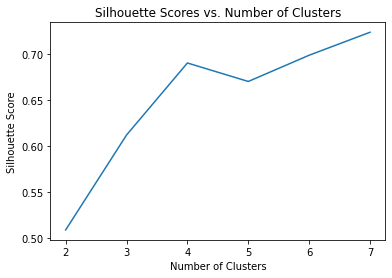

In [212]:
# plot silhouette scores against k values
sns.lineplot(x=k_range, y=sil_scores)
plt.title('Silhouette Scores vs. Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()

The silhouette scores increased as the number of clusters increased from 2 to 7. Clustering into seven groups achieved a silhouette score around 0.75, highest of the n_clusters we tried. We may need to try a higher value for `n_clusters` as it appears that the score can still rise. 

We can choose a few `n_clusters` values and visualize them to evaluate which value makes the most sense.

[DELETE][The silhoutte scores decreased as the number of clusters increased. Clusring into 2 groups had the highest silhouette score of almost 0.99, meaning that the observations in each cluster were very similar to each other.

Note that the range of silhouette scores is not huge - it ranged from about 0.94 to about 0.99.]]]]

Let's run the model with n_clusters=2, n_clusters=4, and n_clusters=7, and then visualize the clusters.



In [213]:
# Run KMeans with n_clusters=2

# instantiate KMeans
kmeans_model_n2 = KMeans(n_clusters=2, random_state=40)

# fit
kmeans_model_n2.fit(dim_reduced_tweets)

# predict
cluster_labels_n2 = kmeans_model_n2.predict(dim_reduced_tweets)

Let's save the model using joblib.

In [214]:
from joblib import dump, load

In [215]:
# save the n_clusters=2 model
dump(kmeans_model_n2, '/content/drive/MyDrive/BrainStation/Capstone/kmeans_model_n2.joblib')



['/content/drive/MyDrive/BrainStation/Capstone/kmeans_model_n2.joblib']

Plot the results.

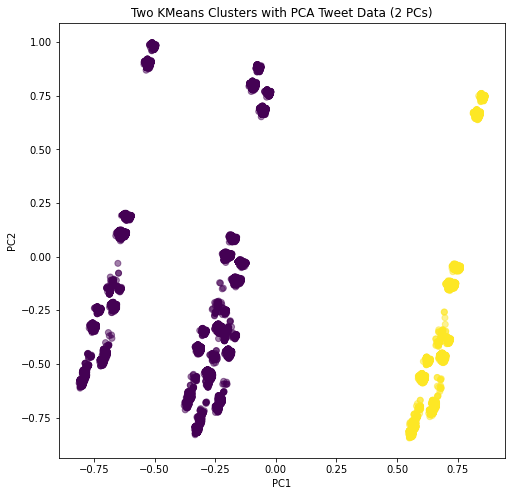

In [216]:
# plot clusters
plt.figure(figsize=(8,8))
plt.scatter(dim_reduced_tweets[:,0], dim_reduced_tweets[:,1], c=cluster_labels_n2, alpha=0.5)
plt.title('Two KMeans Clusters with PCA Tweet Data (2 PCs)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

Now, fit KMeans with n_clusters=4.

In [217]:
# Run KMeans with n_clusters=4

# instantiate KMeans
kmeans_model_n4 = KMeans(n_clusters=4, random_state=40)

# fit
kmeans_model_n4.fit(dim_reduced_tweets)

# predict
cluster_labels_n4 = kmeans_model_n4.predict(dim_reduced_tweets)

In [221]:
# save the model with n_clusters=4
dump(kmeans_model_n4, '/content/drive/MyDrive/BrainStation/Capstone/kmeans_model_n4.joblib')


['/content/drive/MyDrive/BrainStation/Capstone/kmeans_model_n4.joblib']

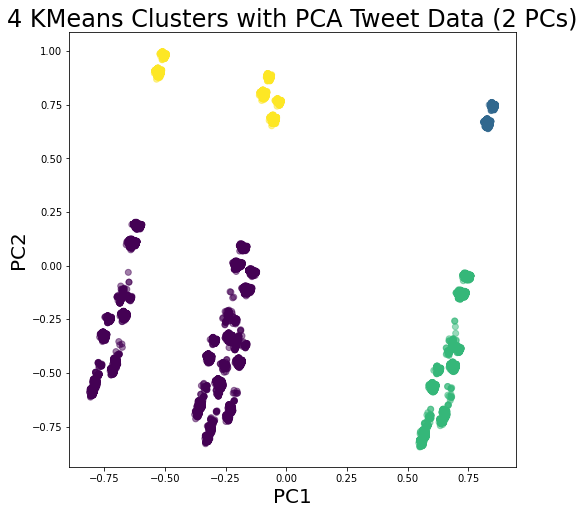

In [218]:
# plot clusters
plt.figure(figsize=(8,8))
plt.scatter(dim_reduced_tweets[:,0], dim_reduced_tweets[:,1], c=cluster_labels_n4, alpha=0.5)
plt.title('4 KMeans Clusters with PCA Tweet Data (2 PCs)', fontsize=24)
plt.xlabel('PC1', fontsize=20)
plt.ylabel('PC2', fontsize=20)
plt.savefig('/content/drive/MyDrive/BrainStation/Capstone/kmeans_4_clusters_pca.png')
plt.show()

In [219]:
# need to convert each cluster label to str type for discrete color bar in Plotly
cluster_labels_n4_str = [str(label) for label in cluster_labels_n4]



In [220]:
# same n_clusters=4 plot but in Plotly for annotation


fig = px.scatter(dim_reduced_tweets, x=dim_reduced_tweets[:,0],
           y=dim_reduced_tweets[:,1],
           color=cluster_labels_n4_str,
           title='KMeans 4 Clusters with PCA',
           labels=cluster_labels_n4_str) # How do I fix the legend and annot.?

fig.update_layout(
    xaxis_title='PC1',
    yaxis_title='PC2'
)

fig.show()

Run KMeans with `n_clusters`=6.

In [228]:
# Run KMeans with n_clusters=6

# instantiate KMeans
kmeans_model_n6 = KMeans(n_clusters=6, random_state=40)

# fit
kmeans_model_n6.fit(dim_reduced_tweets)

# predict
cluster_labels_n6 = kmeans_model_n6.predict(dim_reduced_tweets)

Save this model with `n_clusters`=6.

In [229]:
dump(kmeans_model_n6, '/content/drive/MyDrive/BrainStation/Capstone/kmeans_model_n6.joblib')


['/content/drive/MyDrive/BrainStation/Capstone/kmeans_model_n6.joblib']

Plot the 6 clusters.

In [230]:
# need to convert each cluster label to str type for discrete color bar in Plotly
cluster_labels_n6_str = [str(label) for label in cluster_labels_n6]

In [231]:
# same n_clusters=6 plot in Plotly


fig = px.scatter(dim_reduced_tweets, x=dim_reduced_tweets[:,0],
           y=dim_reduced_tweets[:,1],
           color=cluster_labels_n6_str,
           title='KMeans 6 Clusters with PCA',
           labels=cluster_labels_n6_str) # How do I fix the legend and annot.?

fig.update_layout(
    xaxis_title='PC1',
    yaxis_title='PC2'
)

fig.show()

Run KMeans with `n_clusters`=7.

In [222]:
# Run KMeans with n_clusters=7

# instantiate KMeans
kmeans_model_n7 = KMeans(n_clusters=7, random_state=40)

# fit
kmeans_model_n7.fit(dim_reduced_tweets)

# predict
cluster_labels_n7 = kmeans_model_n7.predict(dim_reduced_tweets)

Save this model with `n_clusters`=7.

In [223]:
dump(kmeans_model_n7, '/content/drive/MyDrive/BrainStation/Capstone/kmeans_model_n7.joblib')


['/content/drive/MyDrive/BrainStation/Capstone/kmeans_model_n7.joblib']

In [224]:
# need to convert each cluster label to str type for discrete color bar in Plotly
cluster_labels_n7_str = [str(label) for label in cluster_labels_n7]



In [226]:
# same n_clusters=7 plot in Plotly


fig = px.scatter(dim_reduced_tweets, x=dim_reduced_tweets[:,0],
           y=dim_reduced_tweets[:,1],
           color=cluster_labels_n7_str,
           title='KMeans 7 Clusters with PCA',
           labels=cluster_labels_n7_str) # How do I fix the legend and annot.?

fig.update_layout(
    xaxis_title='PC1',
    yaxis_title='PC2'
)

fig.show()

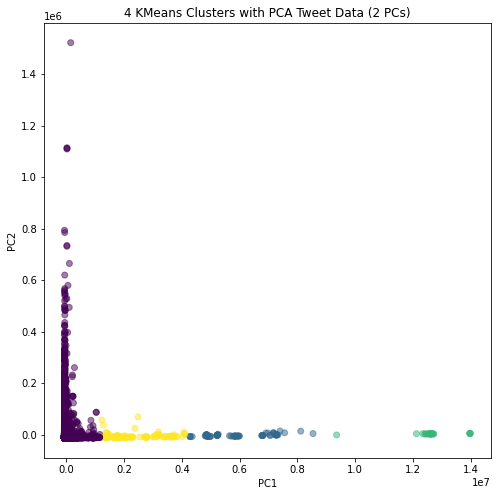

In [ ]:
# plot clusters
plt.figure(figsize=(8,8))
plt.scatter(dim_reduced_tweets[:,0], dim_reduced_tweets[:,1], c=cluster_labels_n4, alpha=0.5)
plt.title('4 KMeans Clusters with PCA Tweet Data (2 PCs)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

It is difficult to make sound evaluations on these PCA dimensionality reduced results. 

However, one could use common sense to speculate on what these clusters may entail. For example, the purple cluster, which is concentrated on the left side of the plot and appears to have the most observations, might be the so-called ordinary Twitter users. The definition of "ordinary" users is hard to pin down, but it may include properties like low to moderate tweet frequency and low to moderate followers count.

The green cluster on the right extreme of the plot may include users that tweet extremely frequently, has many followers, or other combinations of properties. Yellow and blue clusters would have intermediate properties of those of the purple and green clusters. 

These example properties are pure speculations at this point. 

It would be more insightful if we used Plotly to show some properties for each observation in the plot (e.g., original tweet, tweet frequency, account age, etc.).

Let's save the model using joblib.

In [ ]:
from joblib import dump, load

In [ ]:
# save the n_clusters=2 model
dump(kmeans_model_n2, '/content/drive/MyDrive/BrainStation/Capstone/kmeans_model_n2.joblib')

# save the n_clusters=4 model
dump(kmeans_model_n4, '/content/drive/MyDrive/BrainStation/Capstone/kmeans_model_n4.joblib')


['/content/drive/MyDrive/BrainStation/Capstone/kmeans_model_n4.joblib']

In [ ]:
# kmeans_model = load('/content/drive/MyDrive/BrainStation/Capstone/kmeans_model_4_clusters.joblib')

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:333: UserWarning:

Trying to unpickle estimator KMeans from version 0.22.2.post1 when using version 1.0.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations



In [ ]:
# PCA 2 components
# plot


In [ ]:
# cluster_labels = kmeans_model.predict(scaled_data)

In [ ]:

# pca = PCA(n_components=5) 

# pca.fit(scaled_data)

# scaled_data_pca = pca.transform(scaled_data)

# # check shape (i.e., num of principal components)
# print(f'shape of dimension-reduced scaled data: {scaled_data_pca.shape}')

In [ ]:
# # set up a directory to cache the pipeline results
# cachedir = mkdtemp()

# # set up a pipeline framework - these will be changed when passing into grid search
# my_pipeline = Pipeline([('scaler', StandardScaler()), ('dim_reducer', PCA()), ('model', KMeans())], memory=cachedir)

In [ ]:
# # try different n_clusters
# num_clusters = [n for n in range(1,8)]

# kmeans_param_grid = [
      
#       # KMeans with no dimensionality reduction
#       {'scaler': [None, StandardScaler(), MinMaxScaler(), RobustScaler()],
#        'dim_reducer': [None],
#        'model': [KMeans(random_state=40)],
#        'model__n_clusters': num_clusters},

#        # KMeans with PCA using 2 PCs
#       {'scaler': [None, StandardScaler(), MinMaxScaler(), RobustScaler()],
#       'dim_reducer': [PCA()],
#       'dim_reducer__n_components': [2],
#       'model': [KMeans(random_state=40)],
#       'model__n_clusters': num_clusters},
        
#       # # KMeans with PCA using integers (number of PCs)
#       # {'scaler': [None, StandardScaler(), MinMaxScaler(), RobustScaler()],
#       # 'dim_reducer': [PCA()],
#       # 'dim_reducer__n_components': [2],
#       # 'model': [KMeans(random_state=40)],
#       # 'model__n_clusters': num_clusters}

#       #   # KMeans with t-SNE (fractions)
#       #   {'scaler': [None, StandardScaler(), MinMaxScaler(), RobustScaler()],
#       #    'dim_reducer': [TSNE()],
#       #    'dim_reducer__n_components': [0.95, 0.9, 0.85, 0.8],
#       #    'model': [KMeans(random_state=40)],
#       #    'model__n_clusters': num_clusters},

#         # KMeans with t_SNE (2 components)
#       {'scaler': [None, StandardScaler(), MinMaxScaler(), RobustScaler()],
#         'dim_reducer': [TSNE()],
#         'dim_reducer__n_components': [2],
#         'model': [KMeans(random_state=40)],
#         'model__n_clusters': num_clusters}
         
# ]


In [ ]:
# # instantiate the Kmeans grid search
# kmeans_gs = GridSearchCV(my_pipeline, param_grid=kmeans_param_grid, n_jobs=-1, verbose=1)

# # fit the KMeans grid search
# fitted_kmeans_gs = kmeans_gs.fit(tweets_prepped)

Fitting 5 folds for each of 84 candidates, totalling 420 fits


/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:705: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



KeyboardInterrupt: ignored

Running the GridSearchCV as is crashes the kernel because of excessive memory usage. 

Let's drop the One Hot Encoded `screen_name` features.



In [ ]:
tweets_prepped.columns

Index(['is_quote', 'is_retweet', 'favourites_count', 'retweet_count',
       'followers_count', 'friends_count', 'verified', 'is_reply',
       'user_tweet_freq_per_day', 'user_tweet_freq_per_hour',
       ...
       '('country_UG',)', '('country_US',)', '('country_ZA',)',
       '('country_ZM',)', '('country_ZW',)', '('country_country_code NA',)',
       '('time_afternoon',)', '('time_early morning',)', '('time_evening',)',
       '('time_morning',)'],
      dtype='object', length=23408)

In [ ]:
# grab the one hot encoded screen name features (they all have prefix 'name_')
features = tweets_prepped.columns
screen_name_features = []
for feature in features:
  if feature.startswith('name_'):
    screen_name_features.append(feature)

screen_name_features

[]

In [ ]:
tweets_prepped

,is_quote,is_retweet,favourites_count,retweet_count,followers_count,friends_count,verified,is_reply,user_tweet_freq_per_day,user_tweet_freq_per_hour,t_00,t_000,t_04,t_10,t_100,t_11,t_12,t_13,t_14,t_15,t_16,t_17,t_18,t_19,t_1st,t_20,t_200,t_2019,t_2020,t_21,t_22,t_23,t_24,t_25,t_26,t_27,t_28,t_29,t_30,t_40,...,"('country_KW',)","('country_LK',)","('country_LR',)","('country_LU',)","('country_ME',)","('country_ML',)","('country_MV',)","('country_MX',)","('country_MY',)","('country_NG',)","('country_NL',)","('country_NO',)","('country_NP',)","('country_NZ',)","('country_PA',)","('country_PE',)","('country_PH',)","('country_PK',)","('country_PL',)","('country_PT',)","('country_RW',)","('country_SA',)","('country_SE',)","('country_SG',)","('country_SN',)","('country_SO',)","('country_TG',)","('country_TH',)","('country_TR',)","('country_TZ',)","('country_UG',)","('country_US',)","('country_ZA',)","('country_ZM',)","('country_ZW',)","('country_country_code NA',)","('time_afternoon',)","('time_early morning',)","('time_evening',)","('time_morning',)"
0,0,0,14,0,1136,1226,0,1,0.06250,0.002604,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
1,0,0,8,0,30480,167,1,0,4.96875,0.207031,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
2,0,0,5103,0,8413,424,0,0,0.37500,0.015625,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
3,0,0,607,0,77,483,0,0,0.03125,0.001302,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
4,0,0,0,2,833027,40,1,0,74.71875,3.113281,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24395,0,0,1181,1,12463,2960,1,1,7.59375,0.316406,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
24396,0,0,10,0,410,383,0,0,0.31250,0.013021,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
24397,0,0,149,0,20,244,0,1,0.12500,0.005208,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
24398,0,0,170,1,409,801,0,0,0.34375,0.014323,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
